SOA

Trying to imitate the R code in Python and then apply IML techniques

In [4]:
import numpy as np
import pandas as pd

import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

import pyreadr

import warnings
warnings.filterwarnings("ignore")

## ...

In order to read rds files, I have installed pyreadr.

In [16]:
read_file = pyreadr.read_r('D://Codes/ADS/Interpretable-ML-main/Interpretable-ML-main/CAS_PROJECT_FINAL/data_for_input_25mar.rds')

Reading the csv file from rds

In [17]:
data = read_file[None]

data

,policy_number_1,insured_id_2,claim_identification_number,benefit_type,claim_status,treatment_start_date,treatment_end_date,claim_settlement_date,claim_reported_date,claim_billed_amount,...,insured_original_commencement_date,insured_effective_date,insured_termination_date,insured_id_54,relationship_code,residence_location,fraud,claim_count_pa,hospital_location,fraud1
0,H0133815,PFZ70XHNA,CASE/HOSP3P63880/PS1967,MEDICAL,Paid,31-08-2019,04-09-2019,17-09-2019 00:00,04-09-2019,15300.0,...,20-Aug-19,20-Aug-19,19-Aug-20,PFZ70XHNA,NaN,LUDHIANA,0.0,1.0,LUDHIANA,0.0
1,H0133815,PLJLADC4Z,CASE/HOSP3P73510/PS2028,MEDICAL,Paid,31-08-2019,04-09-2019,17-09-2019 00:00,04-09-2019,13500.0,...,20-Aug-19,20-Aug-19,19-Aug-20,PLJLADC4Z,NaN,Tarn Taran,0.0,1.0,Tarn Taran,0.0
2,H0133815,PDAZJSGA2,CASE/HOSP3P63880/PS2696,MEDICAL,Paid,03-09-2019,04-09-2019,17-09-2019 00:00,04-09-2019,16200.0,...,20-Aug-19,20-Aug-19,19-Aug-20,PDAZJSGA2,NaN,LUDHIANA,0.0,5.0,LUDHIANA,0.0
3,H0133815,PRNUSW4LB,CASE/HOSP3G60508/PS2829,MEDICAL,Paid,03-09-2019,05-09-2019,17-09-2019 00:00,05-09-2019,10800.0,...,20-Aug-19,20-Aug-19,19-Aug-20,PRNUSW4LB,NaN,AMRITSAR,0.0,1.0,AMRITSAR,1.0
4,H0133815,PJY24G4MP,CASE/HOSP3G81997/PS1117,MEDICAL,Paid,29-08-2019,03-09-2019,17-09-2019 00:00,03-09-2019,10800.0,...,20-Aug-19,20-Aug-19,19-Aug-20,PJY24G4MP,NaN,LUDHIANA,0.0,1.0,LUDHIANA,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
203191,H0133815,PC07YVO6T,CASE/PS1/HOSP37G26966/PS334660,MEDICAL,Paid,26-03-2020,28-03-2020,15-04-2020 00:00,28-03-2020,11880.0,...,20-Aug-19,20-Aug-19,19-Aug-20,PC07YVO6T,NaN,S.A.S Nagar,0.0,4.0,#N/A,0.0
203192,H0133815,PRFQVP0XY,CASE/PS1/HOSP37G26966/PS334177,SURGICAL,Paid,26-03-2020,16-04-2020,18-04-2020 00:00,16-04-2020,27500.0,...,20-Aug-19,20-Aug-19,19-Aug-20,PRFQVP0XY,NaN,S.A.S Nagar,0.0,1.0,#N/A,0.0
203193,H0133815,P24UC56CR,CASE/PS1/HOSP37G26966/PS345175,MEDICAL,Paid,11-04-2020,16-04-2020,18-04-2020 00:00,16-04-2020,29700.0,...,20-Aug-19,20-Aug-19,19-Aug-20,P24UC56CR,NaN,PATIALA,0.0,2.0,#N/A,0.0
203194,H0133815,PJKQLX75K,CASE/PS1/HOSP37G26966/PS342013,MEDICAL,Paid,06-04-2020,14-04-2020,18-04-2020 00:00,14-04-2020,21780.0,...,20-Aug-19,20-Aug-19,19-Aug-20,PJKQLX75K,NaN,BATHINDA,0.0,3.0,#N/A,0.0


In [18]:
data.columns

Index(['policy_number_1', 'insured_id_2', 'claim_identification_number',
       'benefit_type', 'claim_status', 'treatment_start_date',
       'treatment_end_date', 'claim_settlement_date', 'claim_reported_date',
       'claim_billed_amount', 'approved_allowed_amount',
       'payment_denial_reason', 'claim_paid_amount', 'claim_event_tpa_id',
       'payment_tariff', 'medical_service_provider_id',
       'medical_service_provider_name', 'medical_service_provider_type',
       'medical_service_provider_country', 'doctor_code', 'room_type',
       'no_of_days_stayed', 'mapped_diagnosis_code', 'mapped_diagnosis_name',
       'primary_diagnosis_code', 'primary_diagnosis_name',
       'primary_procedure_code', 'primary_procedure_name',
       'secondary_diagnosis_code', 'secondary_diagnosis_name',
       'secondary_procedure_code', 'secondary_procedure_name',
       'aspirational_district', 'hospital_type', 'category',
       'type_of_public_hospital', 'pg_dnb_teaching_hospital', 'tpa_name'

In [19]:
clean_data = data[["insured_id_2",
    "benefit_type",
    "treatment_start_date",
    "treatment_end_date",
    "claim_reported_date",
    "approved_allowed_amount",
    "medical_service_provider_id",
    "no_of_days_stayed",
    "primary_diagnosis_code",
    "primary_procedure_code",
    "hospital_type",
    "category",
    "policy_commencement_date",
    "policy_termination_date",
    "birth_date",
    "gender_code",
    "residence_location",
    "claim_count_pa",
    "hospital_location",
    "fraud"]]

clean_data.rename(columns= {'insured_id_2':'insured_id'}, inplace= True)

clean_data.columns

Index(['insured_id', 'benefit_type', 'treatment_start_date',
       'treatment_end_date', 'claim_reported_date', 'approved_allowed_amount',
       'medical_service_provider_id', 'no_of_days_stayed',
       'primary_diagnosis_code', 'primary_procedure_code', 'hospital_type',
       'category', 'policy_commencement_date', 'policy_termination_date',
       'birth_date', 'gender_code', 'residence_location', 'claim_count_pa',
       'hospital_location', 'fraud'],
      dtype='object')

In [20]:
clean_data

,insured_id,benefit_type,treatment_start_date,treatment_end_date,claim_reported_date,approved_allowed_amount,medical_service_provider_id,no_of_days_stayed,primary_diagnosis_code,primary_procedure_code,hospital_type,category,policy_commencement_date,policy_termination_date,birth_date,gender_code,residence_location,claim_count_pa,hospital_location,fraud
0,PFZ70XHNA,MEDICAL,31-08-2019,04-09-2019,04-09-2019,15300.0,HOSP3P63880,5.0,M1,M100009,Private,NFSA,20-08-2019,19-08-2020,33.0,Male,LUDHIANA,1.0,LUDHIANA,0.0
1,PLJLADC4Z,MEDICAL,31-08-2019,04-09-2019,04-09-2019,13500.0,HOSP3P73510,5.0,M1,M100026,Private,NFSA,20-08-2019,19-08-2020,29.0,Female,Tarn Taran,1.0,Tarn Taran,0.0
2,PDAZJSGA2,MEDICAL,03-09-2019,04-09-2019,04-09-2019,16200.0,HOSP3P63880,2.0,M1,M100008,Private,NFSA,20-08-2019,19-08-2020,65.0,Male,LUDHIANA,5.0,LUDHIANA,0.0
3,PRNUSW4LB,MEDICAL,03-09-2019,05-09-2019,05-09-2019,10800.0,HOSP3G60508,3.0,M1,M100011,Public,NFSA,20-08-2019,19-08-2020,76.0,Male,AMRITSAR,1.0,AMRITSAR,0.0
4,PJY24G4MP,MEDICAL,29-08-2019,03-09-2019,03-09-2019,10800.0,HOSP3G81997,6.0,M1,M100043,Public,NFSA,20-08-2019,19-08-2020,18.0,Female,LUDHIANA,1.0,LUDHIANA,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
203191,PC07YVO6T,MEDICAL,26-03-2020,28-03-2020,28-03-2020,11880.0,HOSP37G26966,3.0,M1,M100054,Public,NFSA,20-08-2019,19-08-2020,45.0,Male,S.A.S Nagar,4.0,#N/A,0.0
203192,PRFQVP0XY,SURGICAL,26-03-2020,16-04-2020,16-04-2020,27500.0,HOSP37G26966,22.0,S7,S700062,Public,NFSA,20-08-2019,19-08-2020,84.0,Male,S.A.S Nagar,1.0,#N/A,0.0
203193,P24UC56CR,MEDICAL,11-04-2020,16-04-2020,16-04-2020,29700.0,HOSP37G26966,6.0,M1,M100022,Public,NFSA,20-08-2019,19-08-2020,17.0,Male,PATIALA,2.0,#N/A,0.0
203194,PJKQLX75K,MEDICAL,06-04-2020,14-04-2020,14-04-2020,21780.0,HOSP37G26966,9.0,M2,M200014,Public,NFSA,20-08-2019,19-08-2020,10.0,Female,BATHINDA,3.0,#N/A,0.0


Null Values

In [21]:
clean_data.replace("-NA-", np.nan, inplace=True)
clean_data.replace("#N/A", np.nan, inplace=True)

clean_data.isnull().sum().sum()

28796

In [22]:
clean_data = clean_data.dropna()

In [23]:
clean_data.isnull().sum().sum()

0

Data type and data consistency

In [24]:
# Convert columns to their respective data types. Datetime and integers
clean_data[["treatment_start_date", "treatment_end_date", "claim_reported_date", "policy_commencement_date", "policy_termination_date"]] = clean_data[["treatment_start_date", "treatment_end_date", "claim_reported_date", "policy_commencement_date", "policy_termination_date"]].apply(pd.to_datetime)

clean_data[["approved_allowed_amount", "no_of_days_stayed", "fraud", "birth_date", "claim_count_pa"]] = clean_data[["approved_allowed_amount", "no_of_days_stayed", "fraud", "birth_date", "claim_count_pa"]].apply(pd.to_numeric)

# Transforming columns (residence and hospital location) to lower case

clean_data['residence_location'] = clean_data['residence_location'].apply(str.lower)
clean_data['hospital_location'] = clean_data['hospital_location'].apply(str.lower)



In [25]:
# Cross checking the datatypes
clean_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 183115 entries, 0 to 202973
Data columns (total 20 columns):
 #   Column                       Non-Null Count   Dtype         
---  ------                       --------------   -----         
 0   insured_id                   183115 non-null  object        
 1   benefit_type                 183115 non-null  object        
 2   treatment_start_date         183115 non-null  datetime64[ns]
 3   treatment_end_date           183115 non-null  datetime64[ns]
 4   claim_reported_date          183115 non-null  datetime64[ns]
 5   approved_allowed_amount      183115 non-null  float64       
 6   medical_service_provider_id  183115 non-null  object        
 7   no_of_days_stayed            183115 non-null  float64       
 8   primary_diagnosis_code       183115 non-null  object        
 9   primary_procedure_code       183115 non-null  object        
 10  hospital_type                183115 non-null  object        
 11  category                  

In [26]:
clean_data['hospital_location'] = clean_data['hospital_location'].replace({
    "firozpur" : "firozepur",
    "muktsar" : "sri_muktsar_sahib"
})

data_for_corr = clean_data
# distinct_counts = clean_data.applymap(lambda x: x.nunique())

### Preparing input data without triggers

Reducing dimensionality of character columns

In [13]:
mspid = clean_data.groupby('medical_service_provider_id').size().reset_index(name= 'count')
mspid = mspid.sort_values(by= 'count', ascending= False).reset_index(drop= True)

# Considering top 20 unique values from certain columns with large unique values 
print(mspid.head(20)['count'].sum() / mspid['count'].sum())

0.28117303333970456


In [14]:
# Removing features that do not contribute in predicting fraud

clean_data['medical_service_provider_id'] = clean_data['medical_service_provider_id'].apply(lambda x: x if x in mspid.head(20) else 'Others')

data_wo_triggers = clean_data[['insured_id', 'primary_diagnosis_code', 'treatment_start_date', 'treatment_end_date', 'policy_commencement_date', 'policy_termination_date', 'claim_reported_date', 'claim_count_pa']]

## GLM

#### GLM function

In [15]:

from sklearn.linear_model import LogisticRegression
from sklearn.metrics import auc, roc_auc_score, precision_recall_curve, confusion_matrix, roc_curve, average_precision_score, log_loss



def log_reg(train_data, test_data):

    # Splitting data
    X_train = train_data.drop("fraud", axis= 1)
    y_train = train_data["fraud"]
    X_test = test_data.drop("fraud", axis= 1)
    y_test = test_data["fraud"]


    # fit the GLM model using LogisticRegression from SKlearn
    model = LogisticRegression(solver= 'liblinear')
    model.fit(X_train, y_train)


    # Testing Set
    test_prob = model.predict_proba(X_test)[:, 1]


    # Get the ROC curve and calculate the ROC AUC
    roc_auc = roc_auc_score(y_test, test_prob)
    # print(f"roc_auc: {roc_auc}")


    # Get the PR curve
    precision, recall, thresholds = precision_recall_curve(y_test, test_prob)


    # Get the PR AUC
    pr_auc = average_precision_score(y_test, test_prob)
    # print(f"pr_auc:  {pr_auc}")


    # Set threshold bases on the optimal ROC curve threshold
    fpr, tpr, thresholds = roc_curve(y_test, test_prob)
    threshold = thresholds[np.argmax(tpr - fpr)]


    # Create Binary predictions
    model_glm_test_pred = np.where(test_prob > threshold, 1, 0)


    # Confusion Matrix
    c_m = confusion_matrix(y_test, model_glm_test_pred)
    # print(f"CM:\n{c_m}")


    # Printing all the outputs
    print(f" Area Under the Curve and Receiver Operating Characterstics Curve (AUC ROC) : {roc_auc}")
    print(f" Area Under the Precision Recall Curve (PR AUC) : {pr_auc}")
    print(f" Confusion Matrix : \n{c_m}")


    fig = px.area(x= fpr, y=tpr, title= f"Generalized Linear Model's (Logistic) ROC Curve (AUC={auc(fpr, tpr):.4f})", labels= dict(x= 'Specificity', y= 'Sensitivity'), width= 700, height= 500)
    fig.add_shape( type='line', line=dict(dash='dash'), x0=0, x1=1, y0=0, y1=1 )

    fig.update_yaxes(scaleanchor="x", scaleratio=1)
    fig.update_xaxes(constrain='domain')
    # fig.
    fig.show()
    
    return 

#### ADASYN

Adaptive Synthetic Algorithm

Without triggers

In [16]:
adasyn_wo_triggers_train = pyreadr.read_r('D://Codes/ADS/Interpretable-ML-main/Interpretable-ML-main/CAS_PROJECT_FINAL/adasyn_wo_triggers_train.rds')
adasyn_wo_triggers_train = adasyn_wo_triggers_train[None]
adasyn_wo_triggers_test = pyreadr.read_r('D://Codes/ADS/Interpretable-ML-main/Interpretable-ML-main/CAS_PROJECT_FINAL/adasyn_wo_triggers_test.rds')
adasyn_wo_triggers_test = adasyn_wo_triggers_test[None]

log_reg(adasyn_wo_triggers_train, adasyn_wo_triggers_test)

 Area Under the Curve and Receiver Operating Characterstics Curve (AUC ROC) : 0.742397416139301
 Area Under the Precision Recall Curve (PR AUC) : 0.7168145171465181
 Confusion Matrix : 
[[18949 12855]
 [ 5605 26202]]


With triggers

In [17]:
adasyn_w_triggers_train = pyreadr.read_r('D://Codes/ADS/Interpretable-ML-main/Interpretable-ML-main/CAS_PROJECT_FINAL/adasyn_w_triggers_train.rds')
adasyn_w_triggers_train = adasyn_w_triggers_train[None]
adasyn_w_triggers_test = pyreadr.read_r('D://Codes/ADS/Interpretable-ML-main/Interpretable-ML-main/CAS_PROJECT_FINAL/adasyn_w_triggers_test.rds')
adasyn_w_triggers_test = adasyn_w_triggers_test[None]

log_reg(adasyn_w_triggers_train, adasyn_w_triggers_test)

 Area Under the Curve and Receiver Operating Characterstics Curve (AUC ROC) : 0.7833126300936123
 Area Under the Precision Recall Curve (PR AUC) : 0.7835178501830818
 Confusion Matrix : 
[[26899  4905]
 [13610 18167]]


#### SMOTE

Synthetic Minority Over-sampling Technique

Without triggers

In [18]:
smote_wo_triggers_train = pyreadr.read_r('D://Codes/ADS/Interpretable-ML-main/Interpretable-ML-main/CAS_PROJECT_FINAL/smote_wo_triggers_train.rds')
smote_wo_triggers_train = smote_wo_triggers_train[None]
smote_wo_triggers_test = pyreadr.read_r('D://Codes/ADS/Interpretable-ML-main/Interpretable-ML-main/CAS_PROJECT_FINAL/smote_wo_triggers_test.rds')
smote_wo_triggers_test = smote_wo_triggers_test[None]

log_reg(smote_wo_triggers_train, smote_wo_triggers_test)

 Area Under the Curve and Receiver Operating Characterstics Curve (AUC ROC) : 0.7452621273980722
 Area Under the Precision Recall Curve (PR AUC) : 0.6113790106919237
 Confusion Matrix : 
[[23876  7928]
 [ 7440 10686]]


With triggers

In [19]:
smote_w_triggers_train = pyreadr.read_r('D://Codes/ADS/Interpretable-ML-main/Interpretable-ML-main/CAS_PROJECT_FINAL/smote_w_triggers_train.rds')
smote_w_triggers_train = smote_w_triggers_train[None]
smote_w_triggers_test = pyreadr.read_r('D://Codes/ADS/Interpretable-ML-main/Interpretable-ML-main/CAS_PROJECT_FINAL/smote_w_triggers_test.rds')
smote_w_triggers_test = smote_w_triggers_test[None]

log_reg(smote_w_triggers_train, smote_w_triggers_test)

 Area Under the Curve and Receiver Operating Characterstics Curve (AUC ROC) : 0.8732978859896763
 Area Under the Precision Recall Curve (PR AUC) : 0.8185849770382104
 Confusion Matrix : 
[[27527  4277]
 [ 4389 13737]]


#### MWMOTE

Majority Weighted Minority Over-sampling Technique

Without weights

In [20]:
mwmote_wo_triggers_train = pyreadr.read_r('D://Codes/ADS/Interpretable-ML-main/Interpretable-ML-main/CAS_PROJECT_FINAL/mwmote_wo_triggers_train.rds')
mwmote_wo_triggers_train = mwmote_wo_triggers_train[None]
mwmote_wo_triggers_test = pyreadr.read_r('D://Codes/ADS/Interpretable-ML-main/Interpretable-ML-main/CAS_PROJECT_FINAL/mwmote_wo_triggers_test.rds')
mwmote_wo_triggers_test = mwmote_wo_triggers_test[None]

log_reg(mwmote_wo_triggers_train, mwmote_wo_triggers_test)

 Area Under the Curve and Receiver Operating Characterstics Curve (AUC ROC) : 0.7335470737784082
 Area Under the Precision Recall Curve (PR AUC) : 0.7157895902621176
 Confusion Matrix : 
[[15232 16572]
 [ 4326 27478]]


With weights

In [21]:
mwmote_w_triggers_train = pyreadr.read_r('D://Codes/ADS/Interpretable-ML-main/Interpretable-ML-main/CAS_PROJECT_FINAL/mwmote_w_triggers_train.rds')
mwmote_w_triggers_train = mwmote_w_triggers_train[None]
mwmote_w_triggers_test = pyreadr.read_r('D://Codes/ADS/Interpretable-ML-main/Interpretable-ML-main/CAS_PROJECT_FINAL/mwmote_w_triggers_test.rds')
mwmote_w_triggers_test = mwmote_w_triggers_test[None]

log_reg(mwmote_w_triggers_train, mwmote_w_triggers_test)

 Area Under the Curve and Receiver Operating Characterstics Curve (AUC ROC) : 0.9101063994405679
 Area Under the Precision Recall Curve (PR AUC) : 0.9050832080078784
 Confusion Matrix : 
[[27173  4631]
 [ 5363 26441]]


#### ROSE

Random Over-Sampling Examples

Without triggers

In [22]:
rose_wo_triggers_train = pyreadr.read_r('D://Codes/ADS/Interpretable-ML-main/Interpretable-ML-main/CAS_PROJECT_FINAL/rose_wo_triggers_train.rds')
rose_wo_triggers_train = rose_wo_triggers_train[None]
rose_wo_triggers_test = pyreadr.read_r('D://Codes/ADS/Interpretable-ML-main/Interpretable-ML-main/CAS_PROJECT_FINAL/rose_wo_triggers_test.rds')
rose_wo_triggers_test = rose_wo_triggers_test[None]

log_reg(rose_wo_triggers_train, rose_wo_triggers_test)

 Area Under the Curve and Receiver Operating Characterstics Curve (AUC ROC) : 0.7370104344698627
 Area Under the Precision Recall Curve (PR AUC) : 0.7242303532980874
 Confusion Matrix : 
[[23794  8010]
 [13188 18616]]


With triggers

In [23]:
rose_w_triggers_train = pyreadr.read_r('D://Codes/ADS/Interpretable-ML-main/Interpretable-ML-main/CAS_PROJECT_FINAL/rose_w_triggers_train.rds')
rose_w_triggers_train = rose_w_triggers_train[None]
rose_w_triggers_test = pyreadr.read_r('D://Codes/ADS/Interpretable-ML-main/Interpretable-ML-main/CAS_PROJECT_FINAL/rose_w_triggers_test.rds')
rose_w_triggers_test = rose_w_triggers_test[None]

log_reg(rose_w_triggers_train, rose_w_triggers_test)

 Area Under the Curve and Receiver Operating Characterstics Curve (AUC ROC) : 0.8637145827802573
 Area Under the Precision Recall Curve (PR AUC) : 0.8744507053293785
 Confusion Matrix : 
[[28606  3198]
 [ 8853 22951]]


## Naive Bayes Classifier

#### Naive Bayes Classifier function

In [24]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import roc_auc_score, precision_recall_curve, confusion_matrix, roc_curve


def naive_bayes(train_data, test_data):

    # Splitting data
    X_train = train_data.drop("fraud", axis= 1)
    y_train = train_data["fraud"]
    X_test = test_data.drop("fraud", axis= 1)
    y_test = test_data["fraud"]


    # fit the Multimonial Naive Bayes model from SKlearn
    model = MultinomialNB()
    model.fit(X_train, y_train)


    # Testing Set
    test_prob = model.predict_proba(X_test)[:, 1]


    # Get the ROC curve and calculate the ROC AUC
    roc_auc = roc_auc_score(y_test, test_prob)
    # print(f"roc_auc: {roc_auc}")


    # Get the PR curve
    precision, recall, thresholds = precision_recall_curve(y_test, test_prob)


    # Get the PR AUC
    pr_auc = average_precision_score(y_test, test_prob)
    # print(f"pr_auc:  {pr_auc}")


    # Set threshold bases on the optimal ROC curve threshold
    fpr, tpr, thresholds = roc_curve(y_test, test_prob)
    threshold = thresholds[np.argmax(tpr - fpr)]


    # Create Binary predictions
    model_nb_test_pred = np.where(test_prob > threshold, 1, 0)


    # Confusion Matrix
    c_m = confusion_matrix(y_test, model_nb_test_pred)
    # print(f"CM:\n{c_m}")


    # Printing all the outputs
    print(f" Area Under the Curve and Receiver Operating Characterstics Curve (AUC ROC) : {roc_auc}")
    print(f" Area Under the Precision Recall Curve (PR AUC) : {pr_auc}")
    print(f" Confusion Matrix : \n{c_m}")


    fig = px.area(x= fpr, y=tpr, title= f"Naive Bayes' ROC Curve (AUC={auc(fpr, tpr):.4f})", labels= dict(x= 'Specificity', y= 'Sensitivity'), width= 700, height= 500)
    fig.add_shape( type='line', line=dict(dash='dash'), x0=0, x1=1, y0=0, y1=1 )

    fig.update_yaxes(scaleanchor="x", scaleratio=1)
    fig.update_xaxes(constrain='domain')
    fig.show()

    return

#### ADASYN

Adaptive Synthetic Algorithm

Without triggers

In [25]:
adasyn_wo_triggers_train = pyreadr.read_r('D://Codes/ADS/Interpretable-ML-main/Interpretable-ML-main/CAS_PROJECT_FINAL/adasyn_wo_triggers_train.rds')
adasyn_wo_triggers_train = adasyn_wo_triggers_train[None]
adasyn_wo_triggers_test = pyreadr.read_r('D://Codes/ADS/Interpretable-ML-main/Interpretable-ML-main/CAS_PROJECT_FINAL/adasyn_wo_triggers_test.rds')
adasyn_wo_triggers_test = adasyn_wo_triggers_test[None]

naive_bayes(adasyn_wo_triggers_train, adasyn_wo_triggers_test)

 Area Under the Curve and Receiver Operating Characterstics Curve (AUC ROC) : 0.6682007952140064
 Area Under the Precision Recall Curve (PR AUC) : 0.667895911848829
 Confusion Matrix : 
[[24687  7117]
 [12137 19670]]


With triggers

In [26]:
adasyn_w_triggers_train = pyreadr.read_r('D://Codes/ADS/Interpretable-ML-main/Interpretable-ML-main/CAS_PROJECT_FINAL/adasyn_w_triggers_train.rds')
adasyn_w_triggers_train = adasyn_w_triggers_train[None]
adasyn_w_triggers_test = pyreadr.read_r('D://Codes/ADS/Interpretable-ML-main/Interpretable-ML-main/CAS_PROJECT_FINAL/adasyn_w_triggers_test.rds')
adasyn_w_triggers_test = adasyn_w_triggers_test[None]

naive_bayes(adasyn_w_triggers_train, adasyn_w_triggers_test)

 Area Under the Curve and Receiver Operating Characterstics Curve (AUC ROC) : 0.765963752687828
 Area Under the Precision Recall Curve (PR AUC) : 0.7634553017840753
 Confusion Matrix : 
[[21103 10701]
 [ 7965 23812]]


#### SMOTE

Synthetic Minority Over-sampling Technique

Without triggers

In [27]:
smote_wo_triggers_train = pyreadr.read_r('D://Codes/ADS/Interpretable-ML-main/Interpretable-ML-main/CAS_PROJECT_FINAL/smote_wo_triggers_train.rds')
smote_wo_triggers_train = smote_wo_triggers_train[None]
smote_wo_triggers_test = pyreadr.read_r('D://Codes/ADS/Interpretable-ML-main/Interpretable-ML-main/CAS_PROJECT_FINAL/smote_wo_triggers_test.rds')
smote_wo_triggers_test = smote_wo_triggers_test[None]

naive_bayes(smote_wo_triggers_train, smote_wo_triggers_test)

 Area Under the Curve and Receiver Operating Characterstics Curve (AUC ROC) : 0.6986678527838357
 Area Under the Precision Recall Curve (PR AUC) : 0.5678448618471947
 Confusion Matrix : 
[[13755 18049]
 [ 3023 15103]]


With triggers

In [28]:
smote_w_triggers_train = pyreadr.read_r('D://Codes/ADS/Interpretable-ML-main/Interpretable-ML-main/CAS_PROJECT_FINAL/smote_w_triggers_train.rds')
smote_w_triggers_train = smote_w_triggers_train[None]
smote_w_triggers_test = pyreadr.read_r('D://Codes/ADS/Interpretable-ML-main/Interpretable-ML-main/CAS_PROJECT_FINAL/smote_w_triggers_test.rds')
smote_w_triggers_test = smote_w_triggers_test[None]

naive_bayes(smote_w_triggers_train, smote_w_triggers_test)

 Area Under the Curve and Receiver Operating Characterstics Curve (AUC ROC) : 0.8509398153519836
 Area Under the Precision Recall Curve (PR AUC) : 0.7927589925051794
 Confusion Matrix : 
[[27452  4352]
 [ 5066 13060]]


#### MWMOTE

Majority Weighted Minority Over-sampling Technique

Without weights

In [29]:
mwmote_wo_triggers_train = pyreadr.read_r('D://Codes/ADS/Interpretable-ML-main/Interpretable-ML-main/CAS_PROJECT_FINAL/mwmote_wo_triggers_train.rds')
mwmote_wo_triggers_train = mwmote_wo_triggers_train[None]
mwmote_wo_triggers_test = pyreadr.read_r('D://Codes/ADS/Interpretable-ML-main/Interpretable-ML-main/CAS_PROJECT_FINAL/mwmote_wo_triggers_test.rds')
mwmote_wo_triggers_test = mwmote_wo_triggers_test[None]

naive_bayes(mwmote_wo_triggers_train, mwmote_wo_triggers_test)

 Area Under the Curve and Receiver Operating Characterstics Curve (AUC ROC) : 0.7292734456380825
 Area Under the Precision Recall Curve (PR AUC) : 0.7024199783704294
 Confusion Matrix : 
[[14276 17528]
 [ 2827 28977]]


With weights

In [30]:
mwmote_w_triggers_train = pyreadr.read_r('D://Codes/ADS/Interpretable-ML-main/Interpretable-ML-main/CAS_PROJECT_FINAL/mwmote_w_triggers_train.rds')
mwmote_w_triggers_train = mwmote_w_triggers_train[None]
mwmote_w_triggers_test = pyreadr.read_r('D://Codes/ADS/Interpretable-ML-main/Interpretable-ML-main/CAS_PROJECT_FINAL/mwmote_w_triggers_test.rds')
mwmote_w_triggers_test = mwmote_w_triggers_test[None]

naive_bayes(mwmote_w_triggers_train, mwmote_w_triggers_test)

 Area Under the Curve and Receiver Operating Characterstics Curve (AUC ROC) : 0.8914711487641074
 Area Under the Precision Recall Curve (PR AUC) : 0.8917831576866175
 Confusion Matrix : 
[[27764  4040]
 [ 6306 25498]]


#### ROSE

Random Over-Sampling Examples

Without triggers

In [31]:
rose_wo_triggers_train = pyreadr.read_r('D://Codes/ADS/Interpretable-ML-main/Interpretable-ML-main/CAS_PROJECT_FINAL/rose_wo_triggers_train.rds')
rose_wo_triggers_train = rose_wo_triggers_train[None]
rose_wo_triggers_test = pyreadr.read_r('D://Codes/ADS/Interpretable-ML-main/Interpretable-ML-main/CAS_PROJECT_FINAL/rose_wo_triggers_test.rds')
rose_wo_triggers_test = rose_wo_triggers_test[None]

naive_bayes(rose_wo_triggers_train, rose_wo_triggers_test)

 Area Under the Curve and Receiver Operating Characterstics Curve (AUC ROC) : 0.6910499810411213
 Area Under the Precision Recall Curve (PR AUC) : 0.6865052142679812
 Confusion Matrix : 
[[13674 18130]
 [ 5547 26257]]


With triggers

In [32]:
rose_w_triggers_train = pyreadr.read_r('D://Codes/ADS/Interpretable-ML-main/Interpretable-ML-main/CAS_PROJECT_FINAL/rose_w_triggers_train.rds')
rose_w_triggers_train = rose_w_triggers_train[None]
rose_w_triggers_test = pyreadr.read_r('D://Codes/ADS/Interpretable-ML-main/Interpretable-ML-main/CAS_PROJECT_FINAL/rose_w_triggers_test.rds')
rose_w_triggers_test = rose_w_triggers_test[None]

naive_bayes(rose_w_triggers_train, rose_w_triggers_test)

 Area Under the Curve and Receiver Operating Characterstics Curve (AUC ROC) : 0.8440034467773078
 Area Under the Precision Recall Curve (PR AUC) : 0.8564052338003674
 Confusion Matrix : 
[[27299  4505]
 [ 9025 22779]]


## Permutation Feature Importance

#### Functions for each Models

##### GLM (Logistic Regression)

In [33]:
from sklearn.metrics import auc, roc_auc_score, precision_recall_curve, confusion_matrix, roc_curve, average_precision_score, log_loss

from alibi.explainers import PermutationImportance, plot_permutation_importance

def pfi_log(train_data, test_data, score_fns):

    # Splitting data
    X_train = train_data.drop("fraud", axis= 1)
    y_train = train_data['fraud']
    X_test = test_data.drop("fraud", axis= 1)
    y_test = test_data['fraud']

    # fit the GLM model using LogisticRegression from SKlearn
    model = LogisticRegression(solver= 'liblinear')
    model.fit(X_train, y_train)

    # Testing Set
    test_prob = model.predict_proba(X_test)[:, 1]


    # Get the ROC curve and calculate the ROC AUC
    roc_auc = roc_auc_score(y_test, test_prob)


    # Get the PR curve
    precision, recall, thresholds = precision_recall_curve(y_test, test_prob)

  
    # Get the PR AUC
    pr_auc = average_precision_score(y_test, test_prob)


    # Set threshold bases on the optimal ROC curve threshold
    fpr, tpr, thresholds = roc_curve(y_test, test_prob)
    threshold = thresholds[np.argmax(tpr - fpr)]


    # Create Binary predictions
    model_glm_test_pred = np.where(test_prob > threshold, 1, 0)


    # Confusion Matrix
    c_m = confusion_matrix(y_test, model_glm_test_pred)

    # Computing the Permutation Feature Importance
    pfi = PermutationImportance(predictor= model.predict , 
                                # loss_fns= log_loss
                                score_fns= score_fns, 
                                feature_names= X_test.columns)


    # Sending the test values
    exp = pfi.explain(X= X_test.values, y= y_test)


    fi = []

    for i in range(len(exp.data['feature_importance'][0])):
        fi.append(exp.data['feature_importance'][0][i]['mean'])

    plot_permutation_importance(exp, n_cols= 1, fig_kw={'figwidth': 20, 'figheight': 10})
    plt.xlabel("Permutation Feature Importance")
    plt.ylabel('Features')
    plt.xlim([min(fi) - 0.005, max(fi) + 0.005])
    plt.title('Generalized Linear Model (Logistic Regression)')
    plt.show()

    return

##### Naive Bayes

In [34]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import auc, roc_auc_score, precision_recall_curve, confusion_matrix, roc_curve, average_precision_score, log_loss

from alibi.explainers import PermutationImportance, plot_permutation_importance

def pfi_nb(train_data, test_data, score_fns):

    # Splitting data
    X_train = train_data.drop("fraud", axis= 1)
    y_train = train_data['fraud']
    X_test = test_data.drop("fraud", axis= 1)
    y_test = test_data['fraud']

    # fit the Multimonial Naive Bayes model from SKlearn
    model = MultinomialNB()
    model.fit(X_train, y_train)

    # Testing Set
    test_prob = model.predict_proba(X_test)[:, 1]


    # Get the ROC curve and calculate the ROC AUC
    roc_auc = roc_auc_score(y_test, test_prob)


    # Get the PR curve
    precision, recall, thresholds = precision_recall_curve(y_test, test_prob)

  
    # Get the PR AUC
    pr_auc = average_precision_score(y_test, test_prob)


    # Set threshold bases on the optimal ROC curve threshold
    fpr, tpr, thresholds = roc_curve(y_test, test_prob)
    threshold = thresholds[np.argmax(tpr - fpr)]


    # Create Binary predictions
    model_nb_test_pred = np.where(test_prob > threshold, 1, 0)


    # Confusion Matrix
    c_m = confusion_matrix(y_test, model_nb_test_pred)

    # Computing the Permutation Feature Importance
    pfi = PermutationImportance(predictor= model.predict , 
                                # loss_fns= log_loss
                                score_fns= score_fns, 
                                feature_names= X_test.columns)


    # Sending the test values
    exp = pfi.explain(X= X_test.values, y= y_test)

    # Plotting the permutation feature importance plot
    
    fi = []

    for i in range(len(exp.data['feature_importance'][0])):
        fi.append(exp.data['feature_importance'][0][i]['mean'])


    plot_permutation_importance(exp, n_cols= 1, fig_kw={'figwidth': 20, 'figheight': 10})
    plt.xlabel("Permutation Feature Importance")
    plt.ylabel('Features')
    plt.xlim([min(fi) - 0.005, max(fi) + 0.005])
    plt.title('Naive Bayes Classifier')

    plt.show()
    return

##### XGBOOST

In [35]:
import numpy as np
import pandas as pd
import xgboost as xgb
from alibi.explainers import PermutationImportance, plot_permutation_importance
from xgboost import XGBClassifier

def pfi_xgb(train_data, test_data, score_fns):

    # Splitting data
    X_train = train_data.drop("fraud", axis= 1)
    y_train = train_data['fraud']
    X_test = test_data.drop("fraud", axis= 1)
    y_test = test_data['fraud']
    feature_names = X_train.columns.tolist()

    # Create an XGBoost classifier
    model = XGBClassifier()

    # Fit the model to the training data
    model.fit(X_train, y_train)

    # Create a PermutationImportance explainer
    explainer = PermutationImportance(model.predict, 
                                    score_fns= score_fns,
                                    feature_names= X_test.columns)

    # Calculate the permutation feature importance
    exp = explainer.explain(X_test.values, y_test)


    fi = []

    for i in range(len(exp.data['feature_importance'][0])):
        fi.append(exp.data['feature_importance'][0][i]['mean'])


    plot_permutation_importance(exp, n_cols= 1, fig_kw={'figwidth': 20, 'figheight': 10})
    plt.xlabel("Permutation Feature Importance")
    plt.ylabel('Features')
    plt.xlim([min(fi) - 0.005, max(fi) + 0.005])
    plt.title('XGBoost')
    plt.show()

    return

##### GBM

In [36]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import roc_auc_score, average_precision_score, confusion_matrix, roc_curve, auc, precision_recall_curve

from alibi.explainers import PermutationImportance, plot_permutation_importance

def pfi_gbm(train_data, test_data, score_fns):

    # Splitting data
    X_train = train_data.drop("fraud", axis= 1)
    y_train = train_data['fraud']
    X_test = test_data.drop("fraud", axis= 1)
    y_test = test_data['fraud']

    # fit the GLM model using LogisticRegression from SKlearn
    model = GradientBoostingClassifier(n_estimators= 100, loss= 'exponential')
    model.fit(X_train, y_train)

    # Testing Set
    test_prob = model.predict_proba(X_test)[:, 1]


    # Get the ROC curve and calculate the ROC AUC
    roc_auc = roc_auc_score(y_test, test_prob)


    # Get the PR curve
    precision, recall, thresholds = precision_recall_curve(y_test, test_prob)

  
    # Get the PR AUC
    pr_auc = average_precision_score(y_test, test_prob)


    # Set threshold bases on the optimal ROC curve threshold
    fpr, tpr, thresholds = roc_curve(y_test, test_prob)
    threshold = thresholds[np.argmax(tpr - fpr)]


    # Create Binary predictions
    model_gbm_test_pred = np.where(test_prob > threshold, 1, 0)


    # Confusion Matrix
    c_m = confusion_matrix(y_test, model_gbm_test_pred)

    # Computing the Permutation Feature Importance
    pfi = PermutationImportance(predictor= model.predict , 
                                score_fns= score_fns, 
                                feature_names= X_test.columns)


    # Sending the test values and getting
    exp = pfi.explain(X= X_test.values, y= y_test)

    # Plotting the permutation feature importance plot
    
    fi = []

    for i in range(len(exp.data['feature_importance'][0])):
        fi.append(exp.data['feature_importance'][0][i]['mean'])


    plot_permutation_importance(exp, n_cols= 1, fig_kw={'figwidth': 20, 'figheight': 10})
    plt.xlabel("Permutation Feature Importance")
    plt.ylabel('Features')
    plt.xlim([min(fi) - 0.005, max(fi) + 0.005])
    plt.title('Gradient Boosting Machines')
    plt.show()
    return

##### DTC

In [37]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import roc_auc_score, average_precision_score, confusion_matrix, roc_curve, auc, precision_recall_curve

from alibi.explainers import PermutationImportance, plot_permutation_importance

def pfi_dtc(train_data, test_data, score_fns):

    # Splitting data
    X_train = train_data.drop("fraud", axis= 1)
    y_train = train_data['fraud']
    X_test = test_data.drop("fraud", axis= 1)
    y_test = test_data['fraud']

    # fit the GLM model using LogisticRegression from SKlearn
    model = DecisionTreeClassifier(min_samples_split= 5)
    model.fit(X_train, y_train)

    # Testing Set
    test_prob = model.predict_proba(X_test)[:, 1]


    # Get the ROC curve and calculate the ROC AUC
    roc_auc = roc_auc_score(y_test, test_prob)


    # Get the PR curve
    precision, recall, thresholds = precision_recall_curve(y_test, test_prob)

  
    # Get the PR AUC
    pr_auc = average_precision_score(y_test, test_prob)


    # Set threshold bases on the optimal ROC curve threshold
    fpr, tpr, thresholds = roc_curve(y_test, test_prob)
    threshold = thresholds[np.argmax(tpr - fpr)]


    # Create Binary predictions
    model_dtc_test_pred = np.where(test_prob > threshold, 1, 0)


    # Confusion Matrix
    c_m = confusion_matrix(y_test, model_dtc_test_pred)

    # Computing the Permutation Feature Importance
    pfi = PermutationImportance(predictor= model.predict , 
                                score_fns= score_fns, 
                                feature_names= X_test.columns)


    # Sending the test values and getting
    exp = pfi.explain(X= X_test.values, y= y_test)

    # Plotting the permutation feature importance plot
    
    fi = []

    for i in range(len(exp.data['feature_importance'][0])):
        fi.append(exp.data['feature_importance'][0][i]['mean'])


    plot_permutation_importance(exp, n_cols= 1, fig_kw={'figwidth': 20, 'figheight': 10})
    plt.xlabel("Permutation Feature Importance")
    plt.ylabel('Features')
    plt.xlim([min(fi) - 0.005, max(fi) + 0.005])
    plt.title('Decision Tree Classifier')

    plt.show()
    return

##### RDF

In [38]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_auc_score, average_precision_score, confusion_matrix, roc_curve, auc, precision_recall_curve

from alibi.explainers import PermutationImportance, plot_permutation_importance

def pfi_rdf(train_data, test_data, score_fns):

    # Splitting data
    X_train = train_data.drop("fraud", axis= 1)
    y_train = train_data['fraud']
    X_test = test_data.drop("fraud", axis= 1)
    y_test = test_data['fraud']

    # fit the GLM model using LogisticRegression from SKlearn
    model = RandomForestClassifier(n_estimators= 100, random_state= 42)
    model.fit(X_train, y_train)

    # Testing Set
    test_prob = model.predict_proba(X_test)[:, 1]


    # Get the ROC curve and calculate the ROC AUC
    roc_auc = roc_auc_score(y_test, test_prob)


    # Get the PR curve
    precision, recall, thresholds = precision_recall_curve(y_test, test_prob)

  
    # Get the PR AUC
    pr_auc = average_precision_score(y_test, test_prob)


    # Set threshold bases on the optimal ROC curve threshold
    fpr, tpr, thresholds = roc_curve(y_test, test_prob)
    threshold = thresholds[np.argmax(tpr - fpr)]


    # Create Binary predictions
    model_rdf_test_pred = np.where(test_prob > threshold, 1, 0)


    # Confusion Matrix
    c_m = confusion_matrix(y_test, model_rdf_test_pred)

    # Computing the Permutation Feature Importance
    pfi = PermutationImportance(predictor= model.predict , 
                                score_fns= score_fns, 
                                feature_names= X_test.columns)


    # Sending the test values and getting
    exp = pfi.explain(X= X_test.values, y= y_test)

    # Plotting the permutation feature importance plot
    
    fi = []

    for i in range(len(exp.data['feature_importance'][0])):
        fi.append(exp.data['feature_importance'][0][i]['mean'])


    plot_permutation_importance(exp, n_cols= 1, fig_kw={'figwidth': 20, 'figheight': 10})
    plt.xlabel("Permutation Feature Importance")
    plt.ylabel('Features')
    plt.xlim([min(fi) - 0.005, max(fi) + 0.005])
    plt.title('Random Forest')

    plt.show()
    return

#### ADASYN

Adaptive Synthetic Algorithm

Without triggers

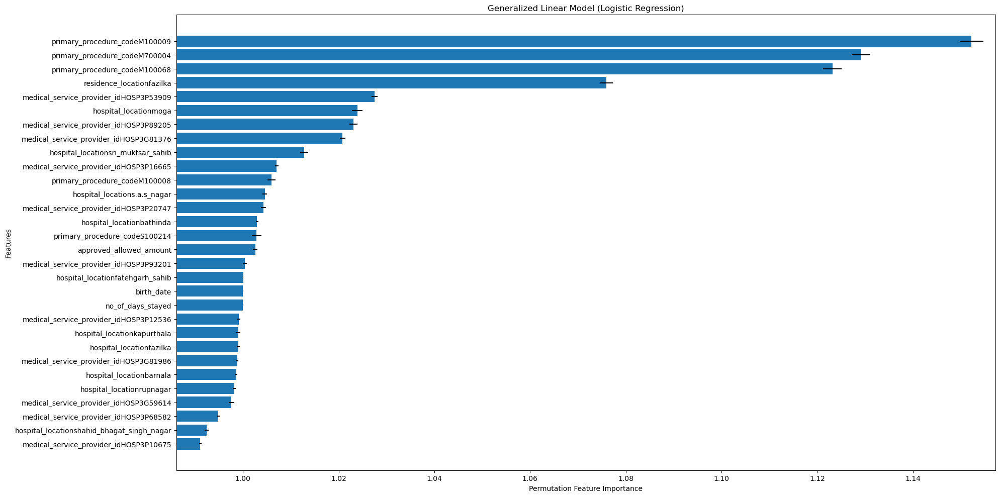

In [39]:
pfi_log(adasyn_wo_triggers_train, adasyn_wo_triggers_test, ['f1']) 

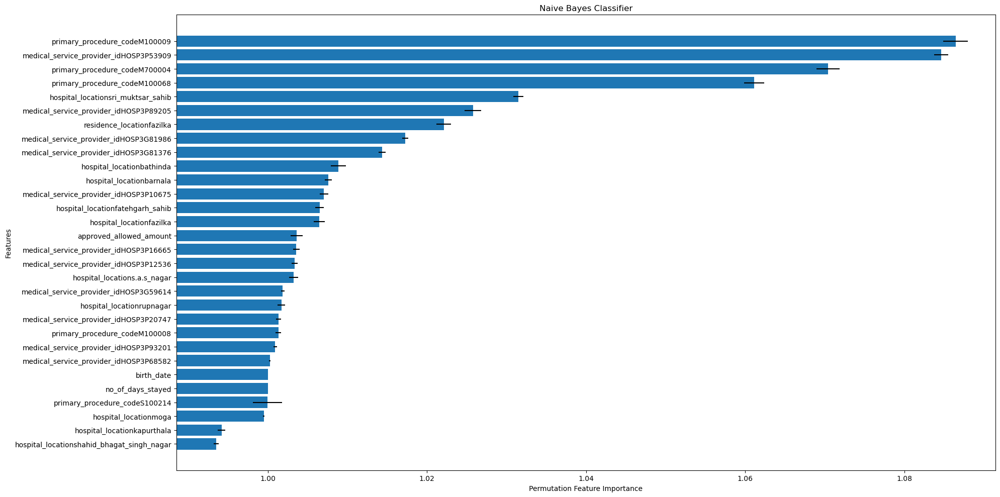

In [40]:
pfi_nb(adasyn_wo_triggers_train, adasyn_wo_triggers_test, ['f1'])

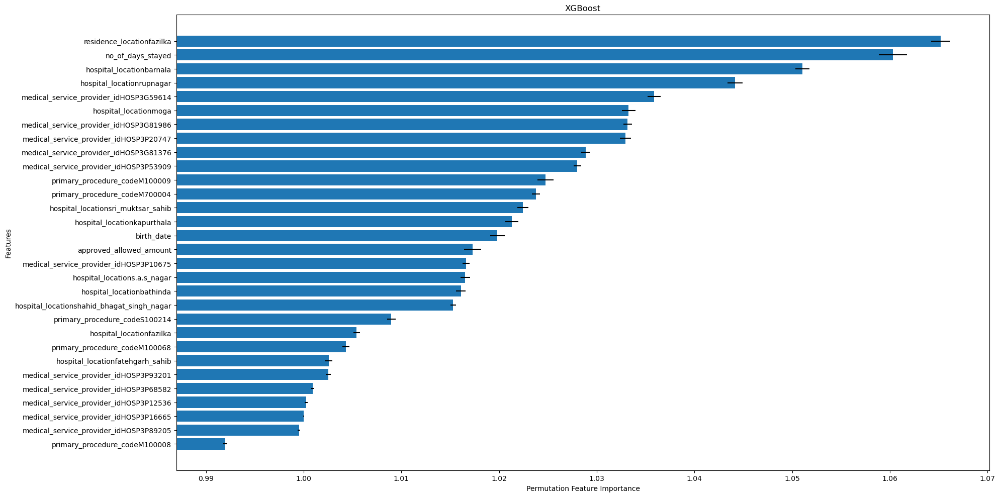

In [41]:
pfi_xgb(adasyn_wo_triggers_train, adasyn_wo_triggers_test, ['f1'])

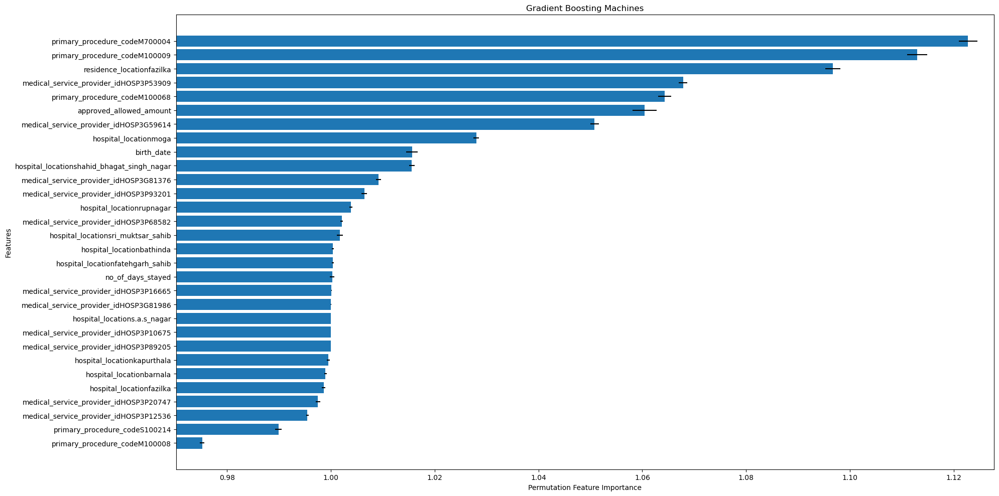

In [42]:
pfi_gbm(adasyn_wo_triggers_train, adasyn_wo_triggers_test, ['f1'])

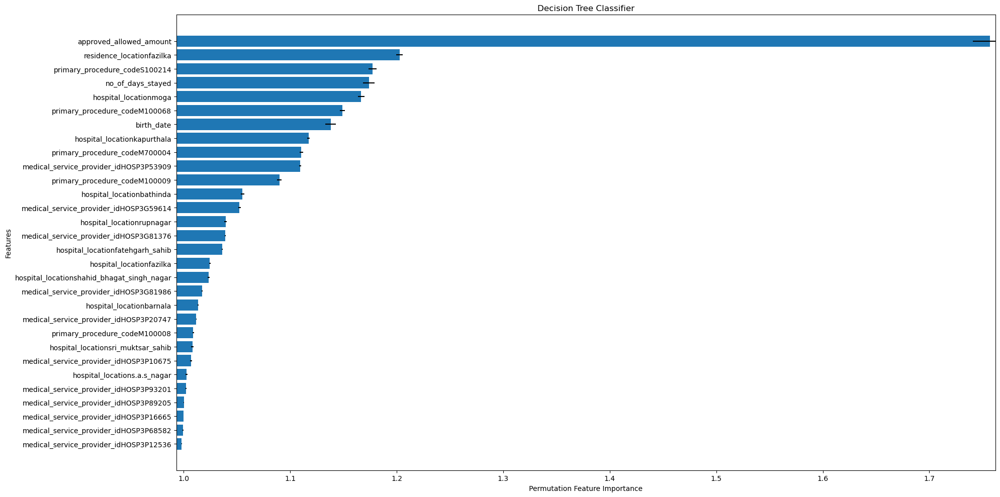

In [43]:
pfi_dtc(adasyn_wo_triggers_train, adasyn_wo_triggers_test, ['f1'])

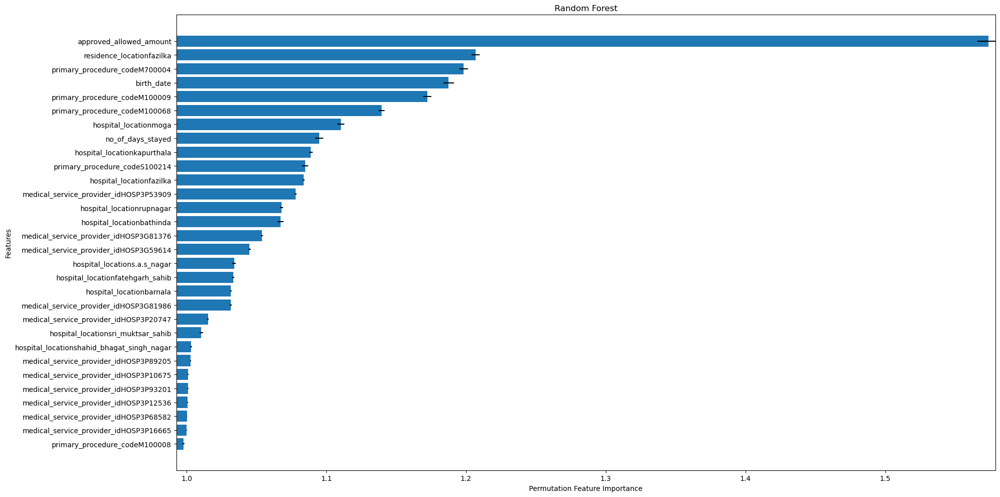

In [44]:
pfi_rdf(adasyn_wo_triggers_train, adasyn_wo_triggers_test, ['f1'])

With triggers

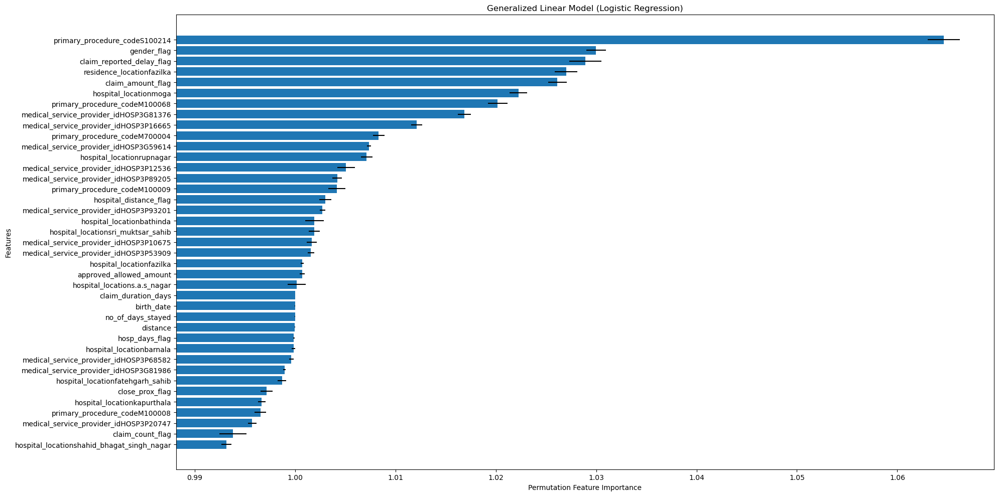

In [45]:
pfi_log(adasyn_w_triggers_train, adasyn_w_triggers_test, ['f1'])

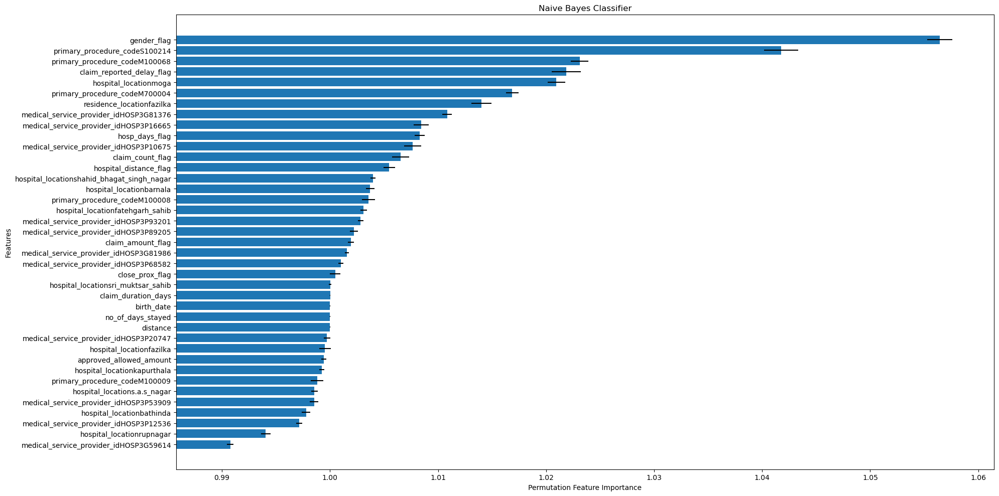

In [46]:
pfi_nb(adasyn_w_triggers_train, adasyn_w_triggers_test, ['f1'])

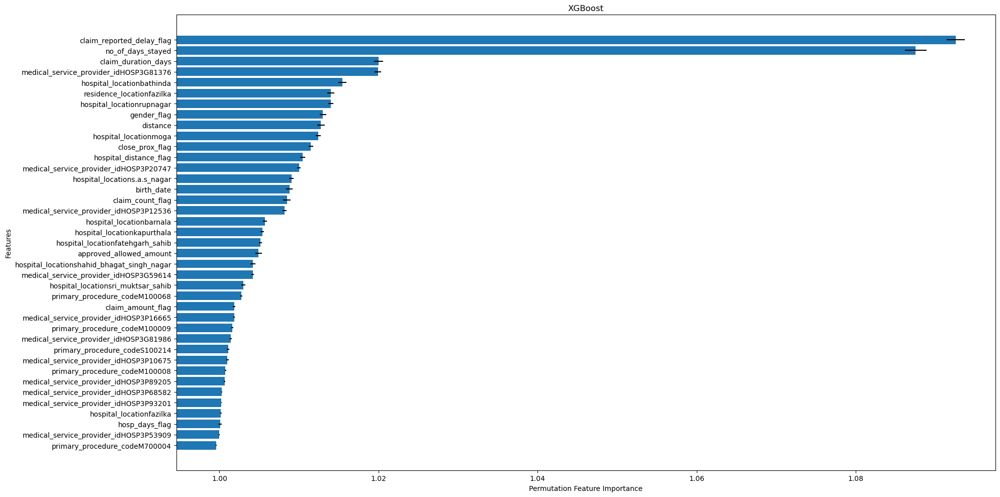

In [47]:
pfi_xgb(adasyn_w_triggers_train, adasyn_w_triggers_test, ['f1'])

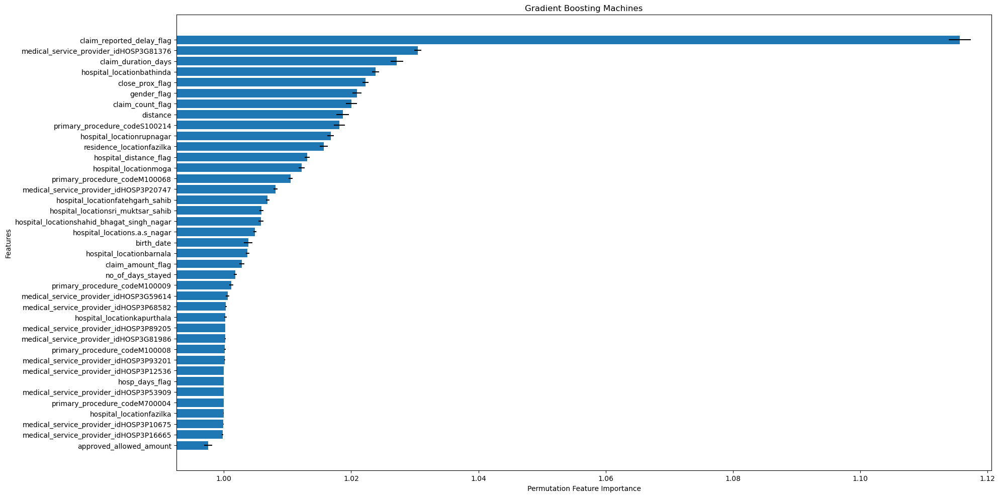

In [48]:
pfi_gbm(adasyn_w_triggers_train, adasyn_w_triggers_test, ['f1'])

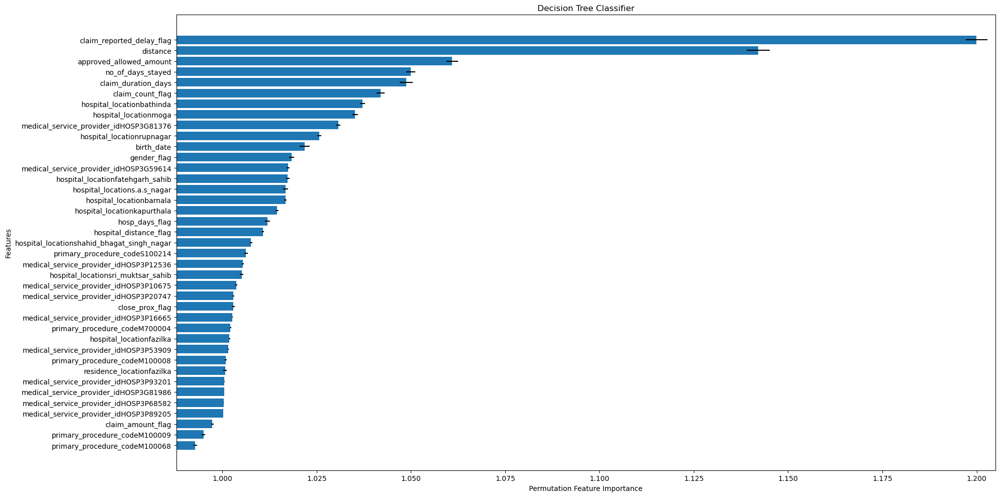

In [49]:
pfi_dtc(adasyn_w_triggers_train, adasyn_w_triggers_test, ['f1'])

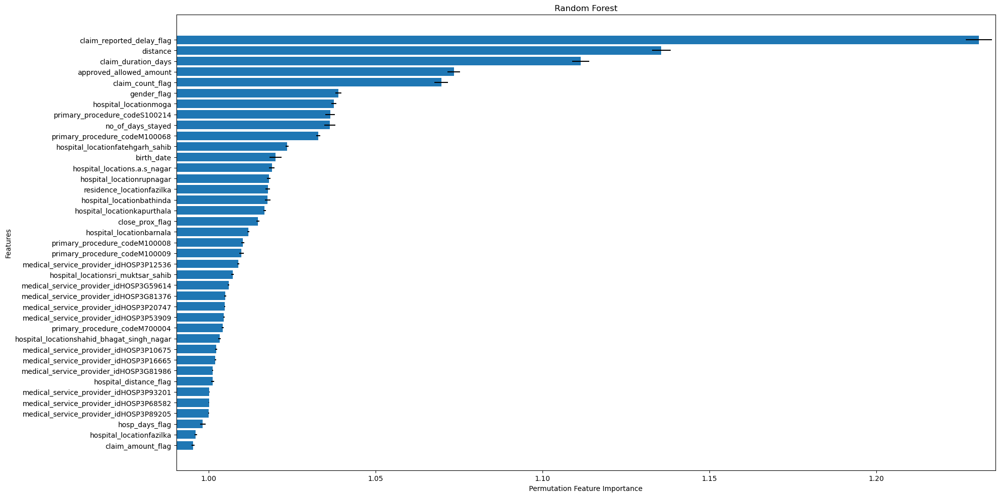

In [50]:
pfi_rdf(adasyn_w_triggers_train, adasyn_w_triggers_test, ['f1'])

#### SMOTE

Synthetic Minority Over-sampling Technique

Without triggers

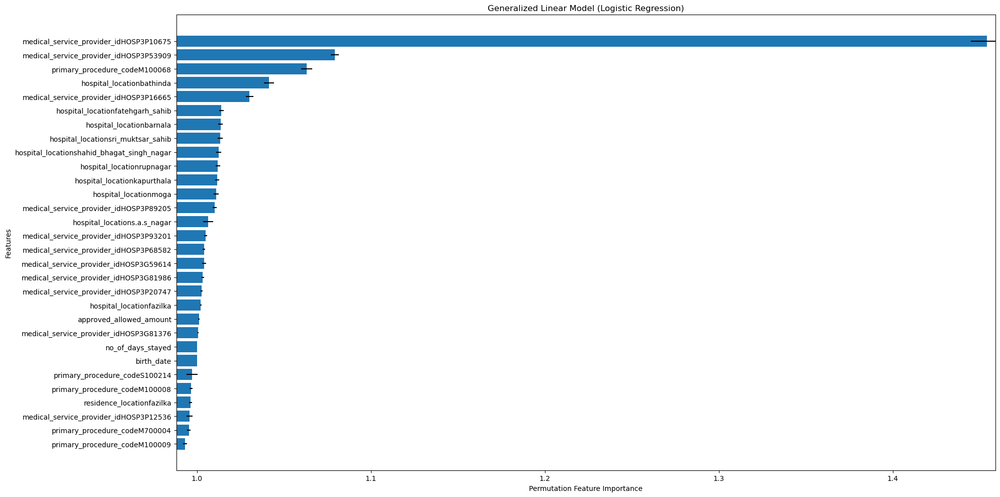

In [51]:
pfi_log(smote_wo_triggers_train, smote_wo_triggers_test, ['f1'])

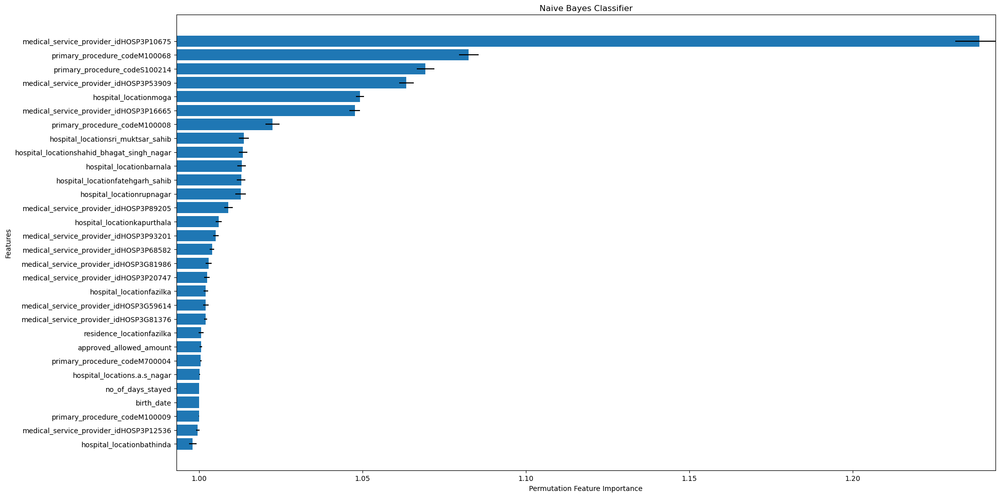

In [52]:
pfi_nb(smote_wo_triggers_train, smote_wo_triggers_test, ['f1'])

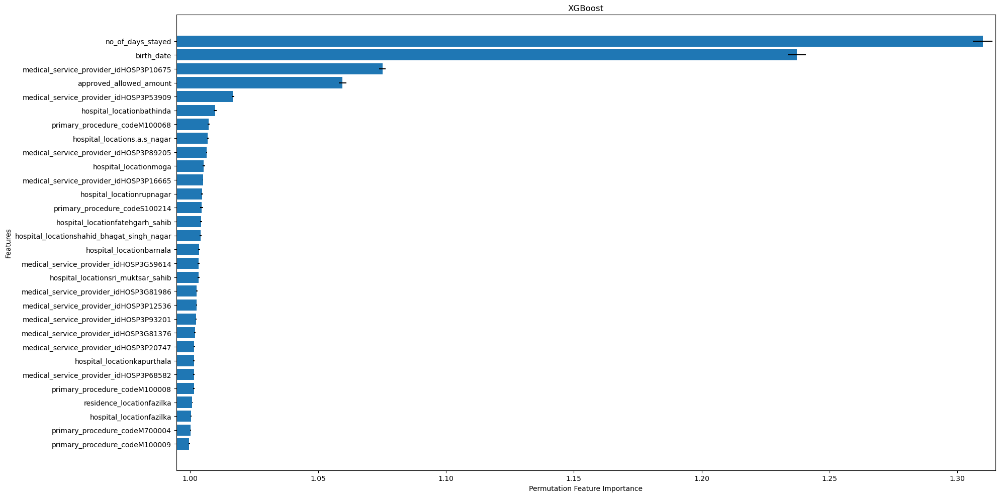

In [53]:
pfi_xgb(smote_wo_triggers_train, smote_wo_triggers_test, ['f1'])

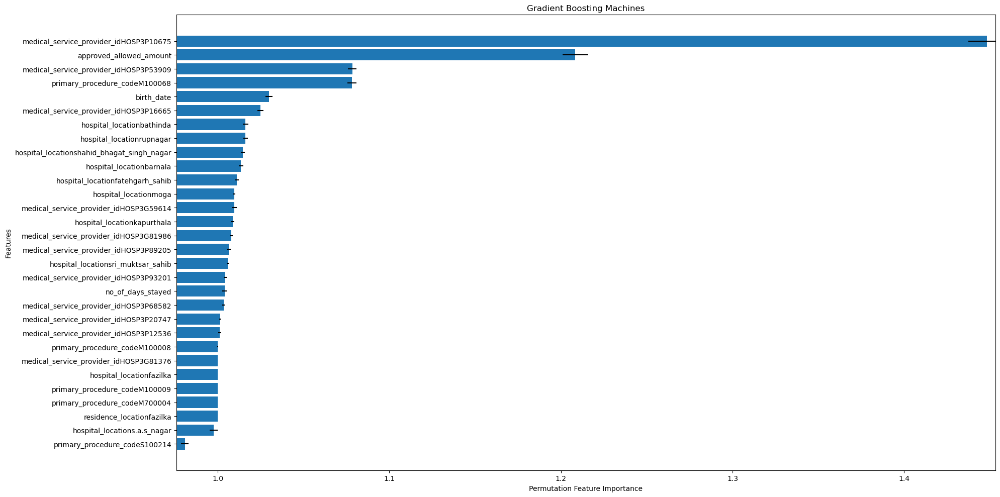

In [54]:
pfi_gbm(smote_wo_triggers_train, smote_wo_triggers_test, ['f1'])

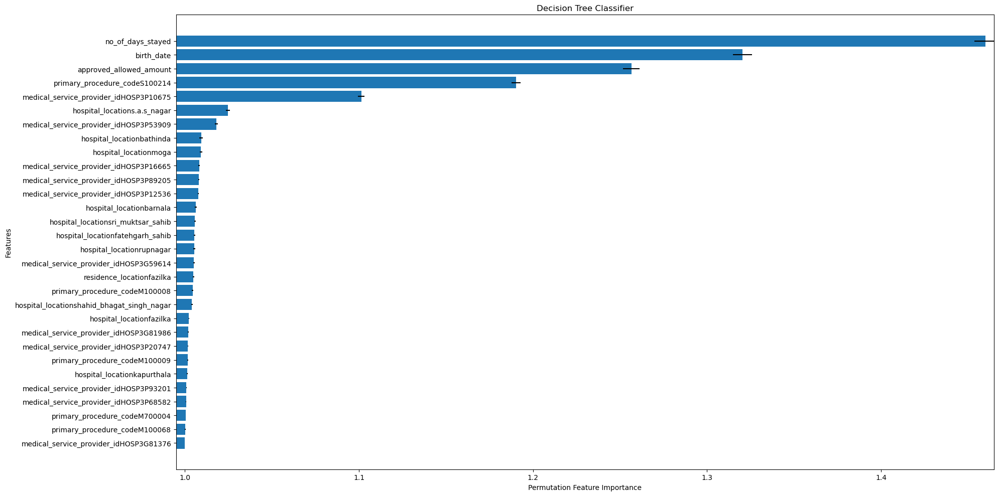

In [55]:
pfi_dtc(smote_wo_triggers_train, smote_wo_triggers_test, ['f1'])

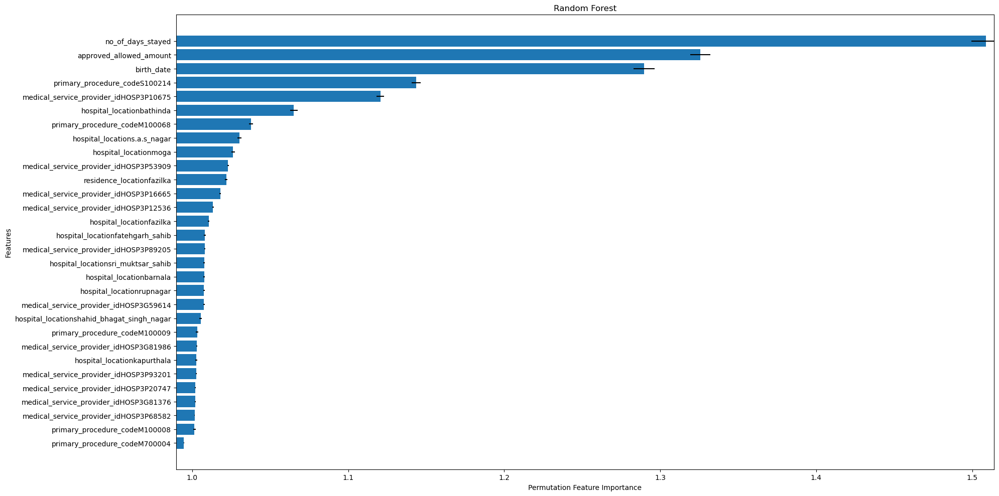

In [56]:
pfi_rdf(smote_wo_triggers_train, smote_wo_triggers_test, ['f1'])

With triggers

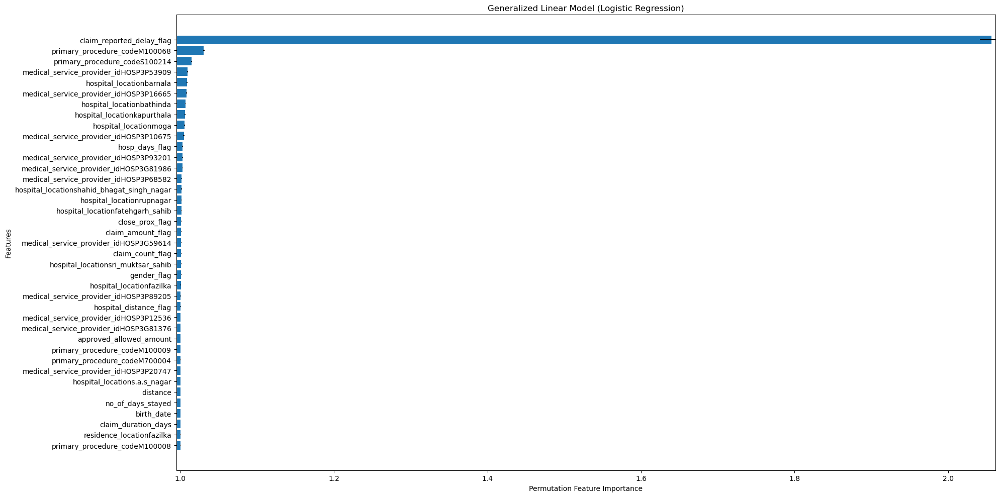

In [57]:
pfi_log(smote_w_triggers_train, smote_w_triggers_test, ['f1'])

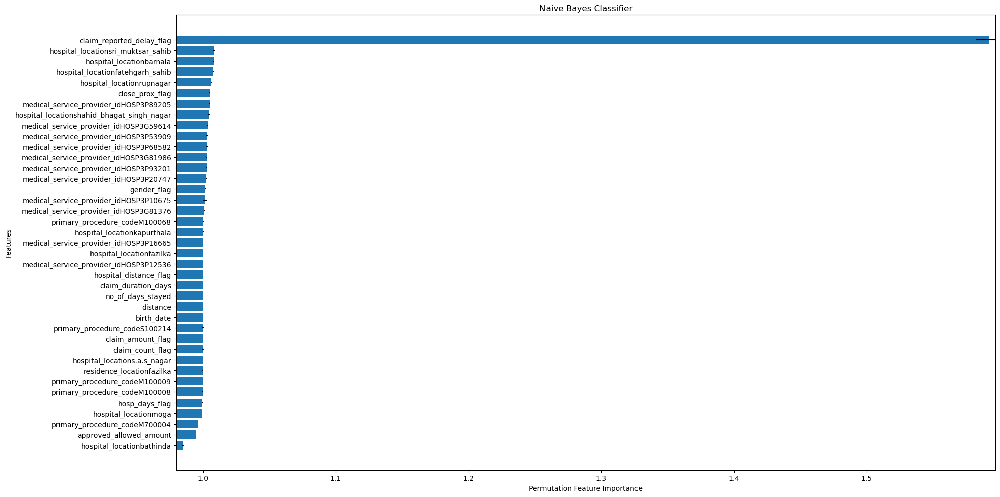

In [58]:
pfi_nb(smote_w_triggers_train, smote_w_triggers_test, ['f1'])

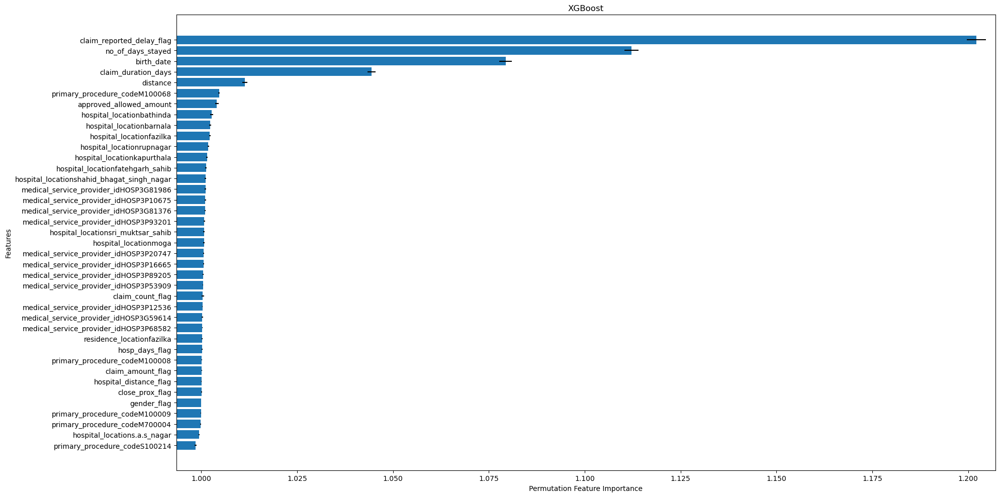

In [59]:
pfi_xgb(smote_w_triggers_train, smote_w_triggers_test, ['f1'])

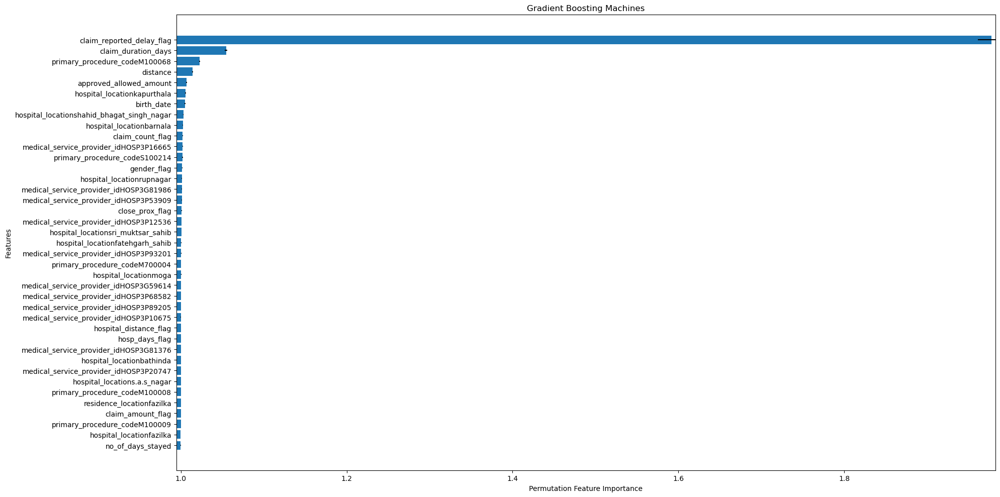

In [60]:
pfi_gbm(smote_w_triggers_train, smote_w_triggers_test, ['f1'])

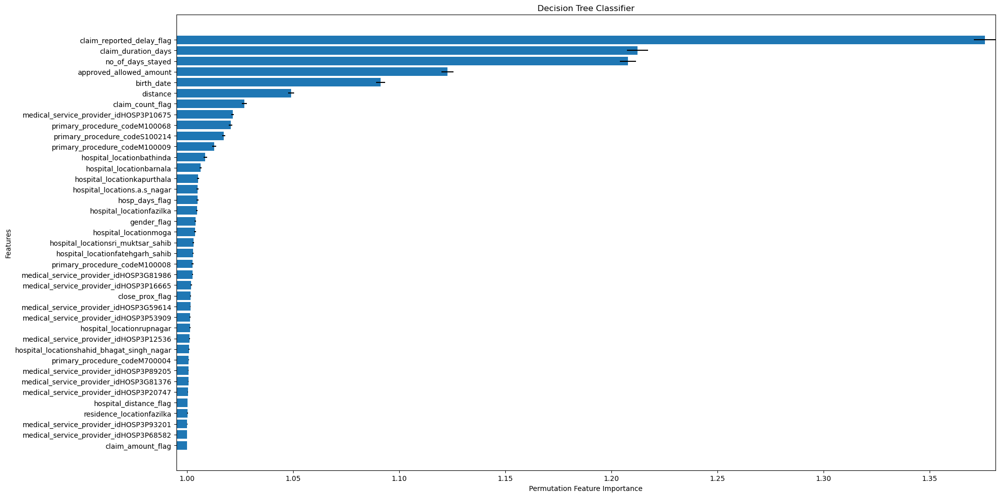

In [61]:
pfi_dtc(smote_w_triggers_train, smote_w_triggers_test, ['f1'])

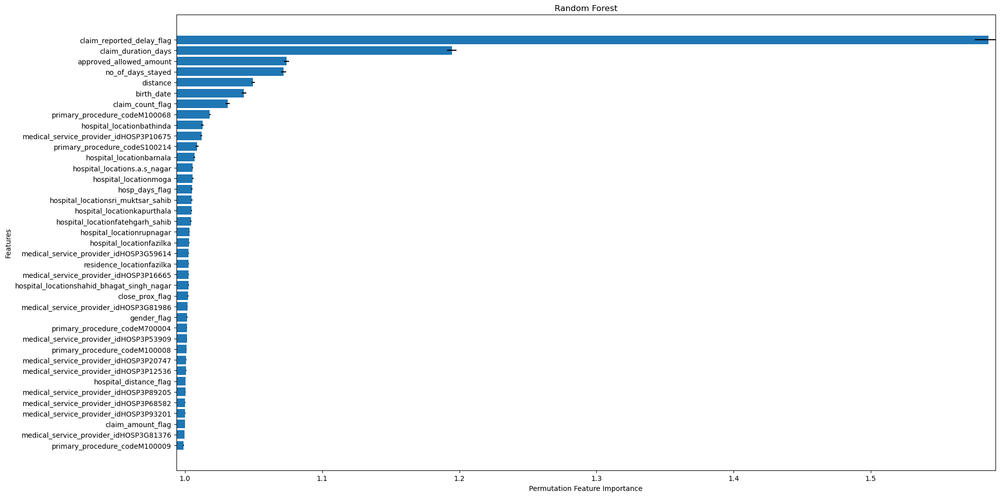

In [62]:
pfi_rdf(smote_w_triggers_train, smote_w_triggers_test, ['f1'])

#### MWMOTE

Majority Weighted Minority Over-sampling Technique

Without weights

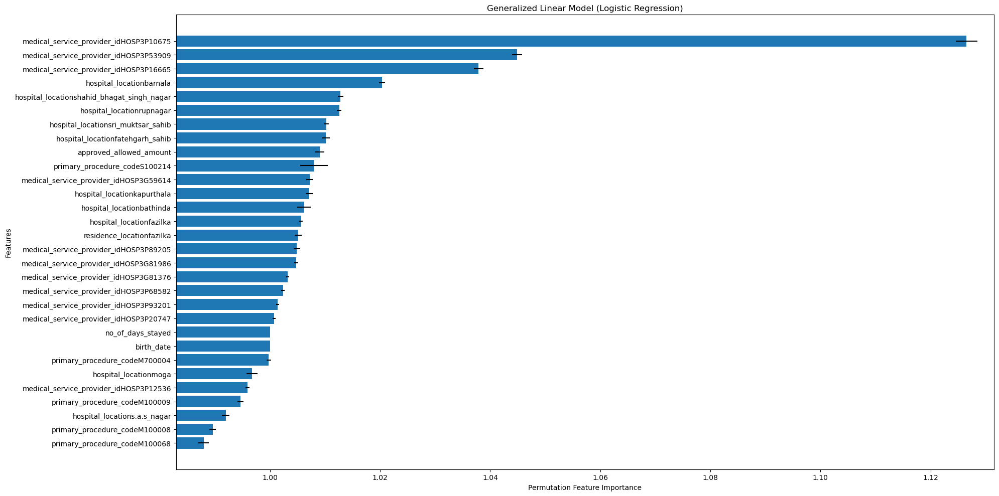

In [63]:
pfi_log(mwmote_wo_triggers_train, mwmote_wo_triggers_test, ['f1'])

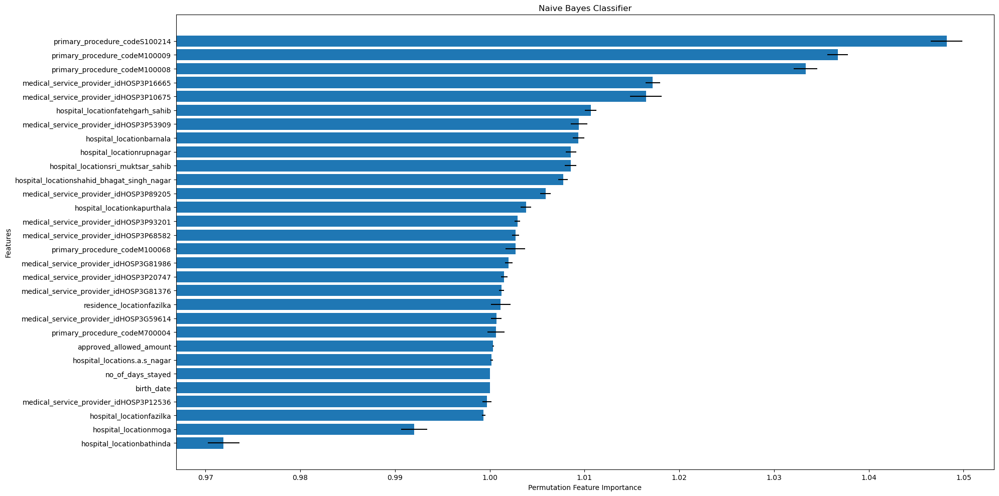

In [64]:
pfi_nb(mwmote_wo_triggers_train, mwmote_wo_triggers_test, ['f1'])

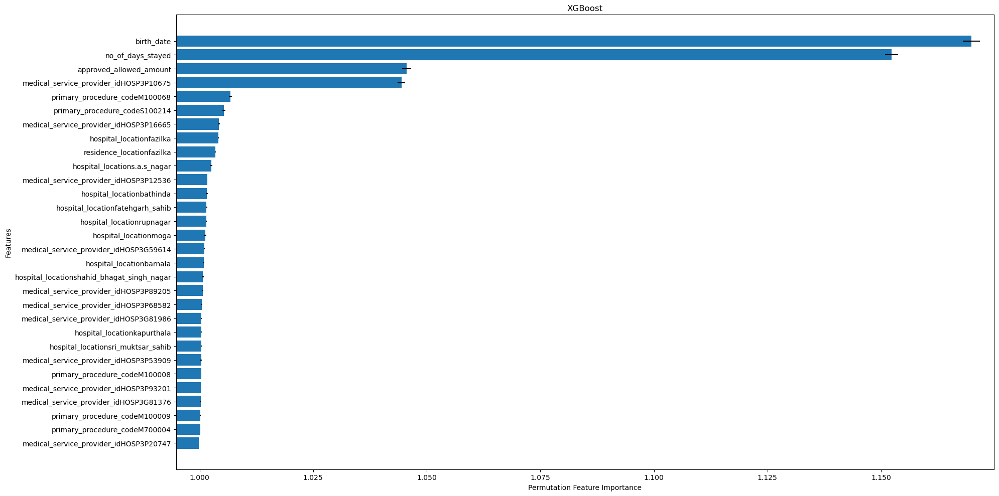

In [65]:
pfi_xgb(mwmote_wo_triggers_train, mwmote_wo_triggers_test, ['f1'])

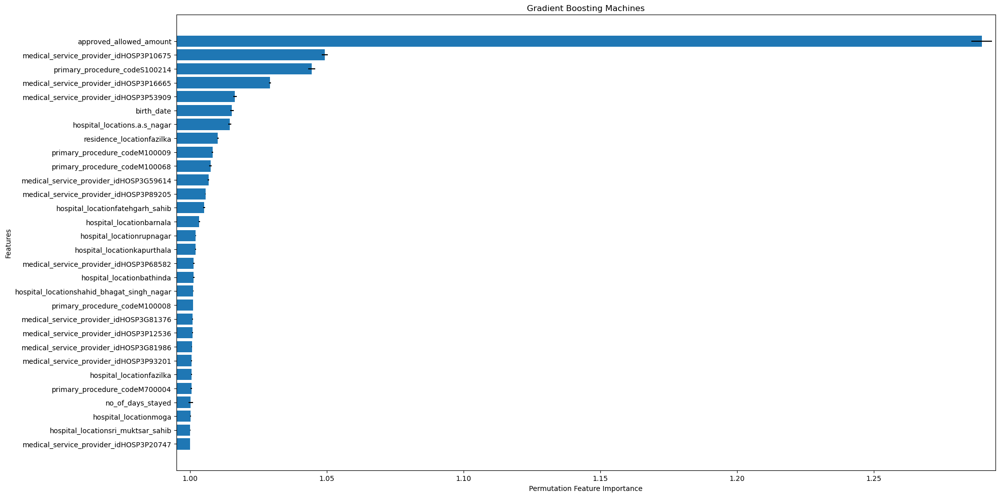

In [66]:
pfi_gbm(mwmote_wo_triggers_train, mwmote_wo_triggers_test, ['f1'])

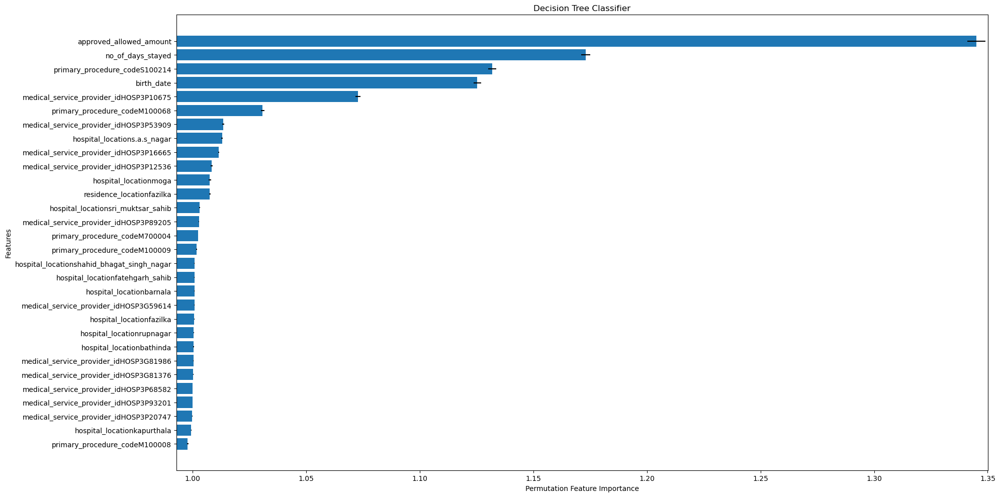

In [67]:
pfi_dtc(mwmote_wo_triggers_train, mwmote_wo_triggers_test, ['f1'])

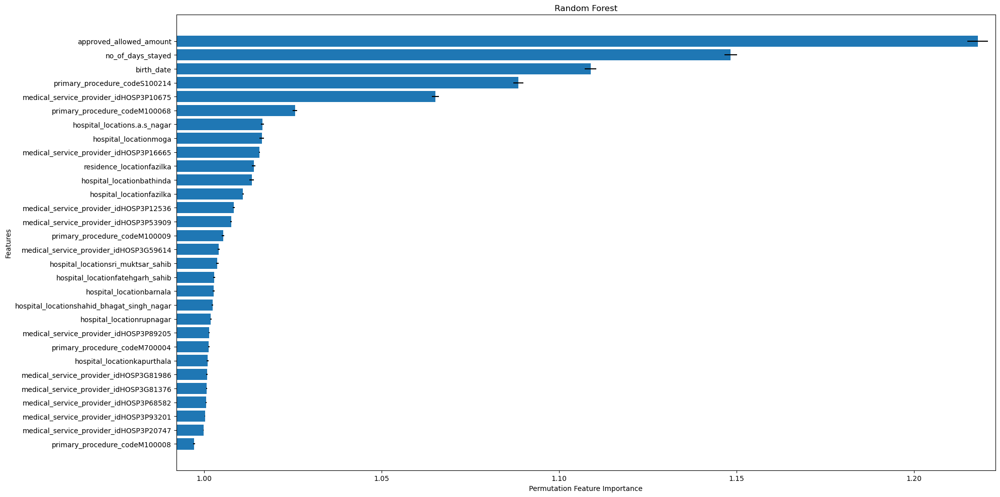

In [68]:
pfi_rdf(mwmote_wo_triggers_train, mwmote_wo_triggers_test, ['f1'])

With weights

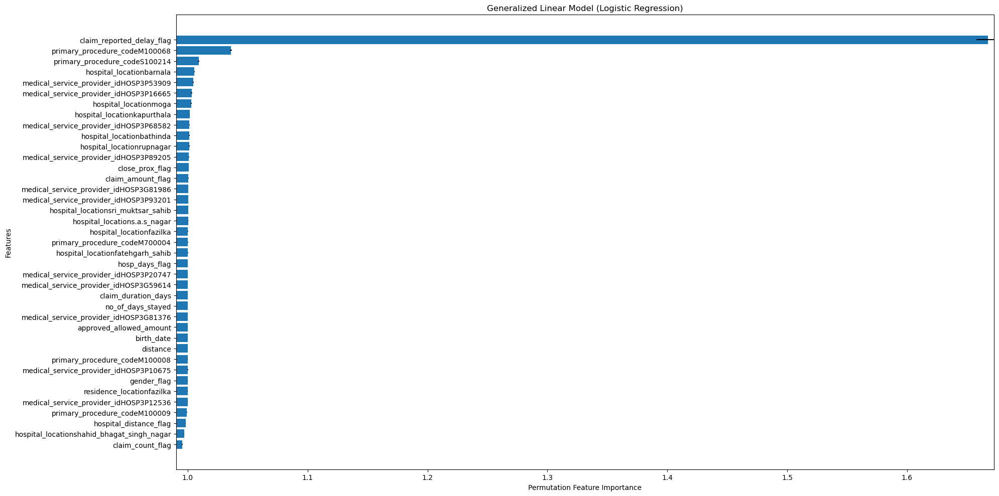

In [69]:
pfi_log(mwmote_w_triggers_train, mwmote_w_triggers_test, ['f1'])

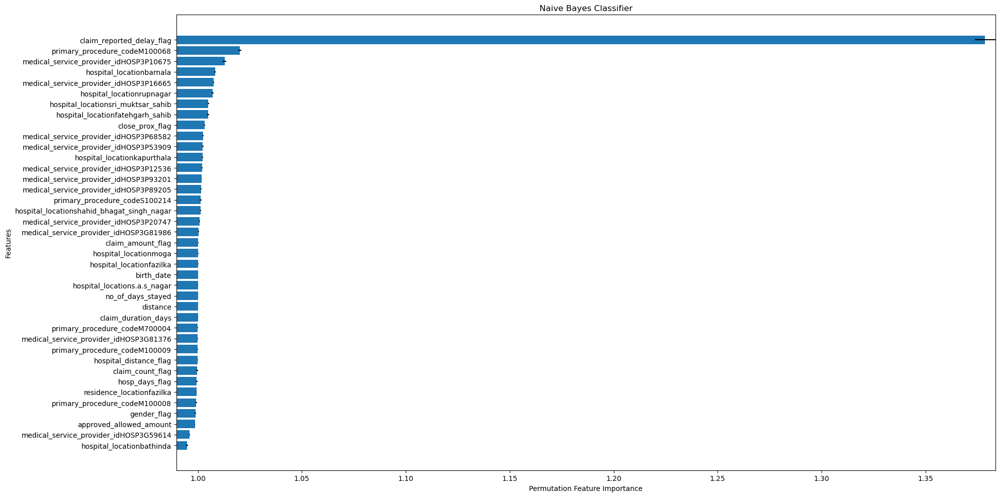

In [70]:
pfi_nb(mwmote_w_triggers_train, mwmote_w_triggers_test, ['f1'])

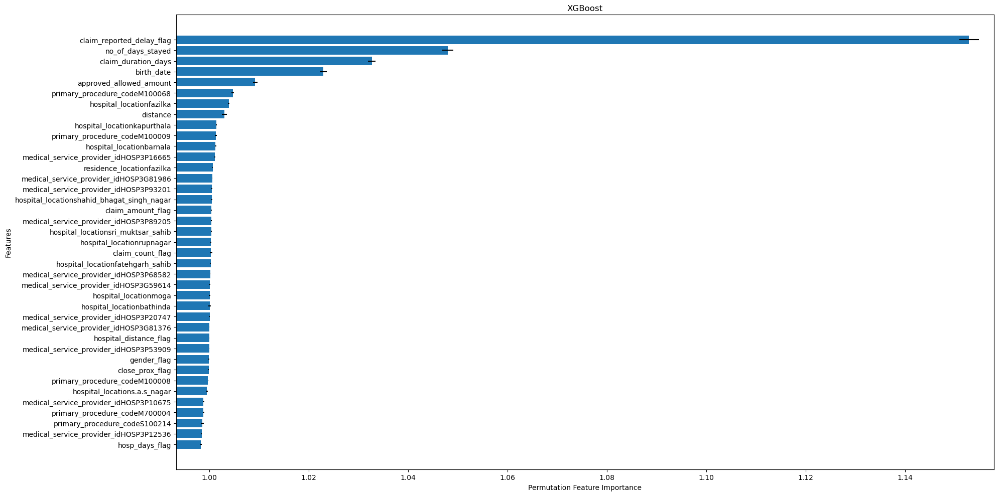

In [71]:
pfi_xgb(mwmote_w_triggers_train, mwmote_w_triggers_test, ['f1'])

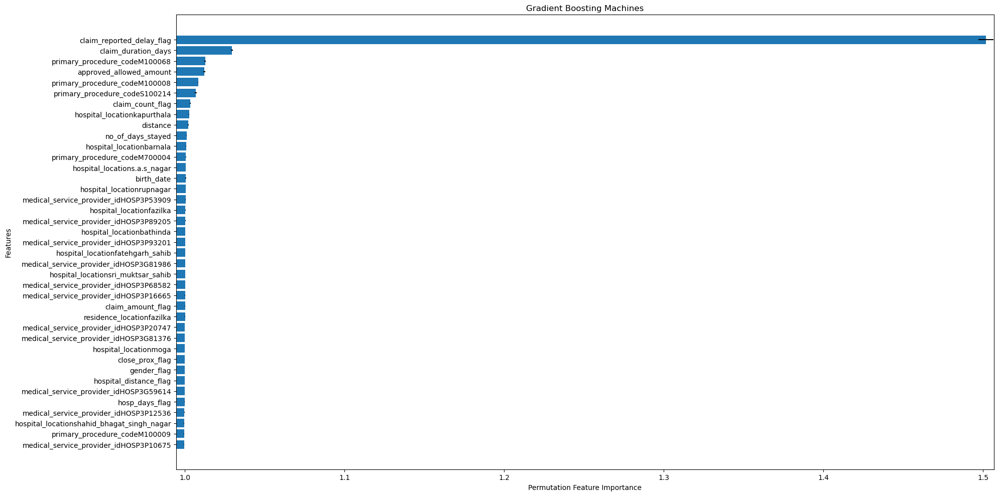

In [72]:
pfi_gbm(mwmote_w_triggers_train, mwmote_w_triggers_test, ['f1'])

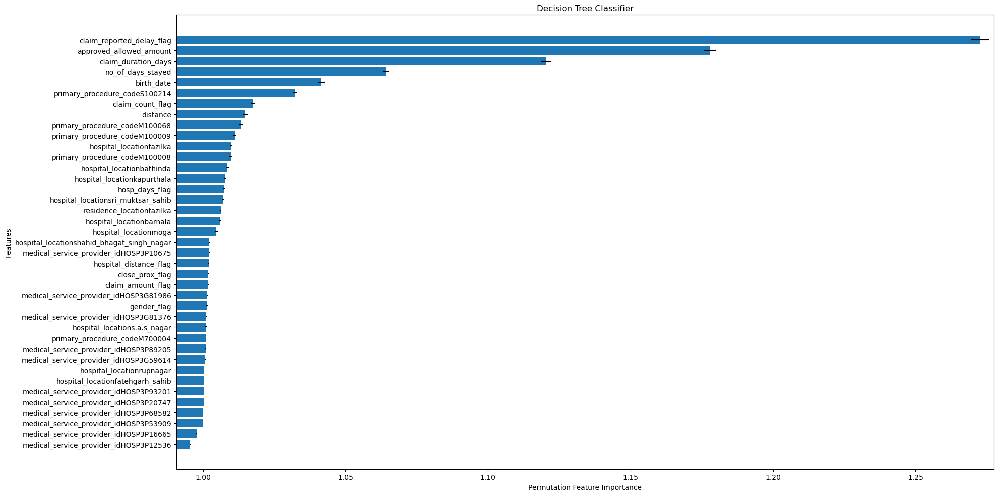

In [73]:
pfi_dtc(mwmote_w_triggers_train, mwmote_w_triggers_test, ['f1'])

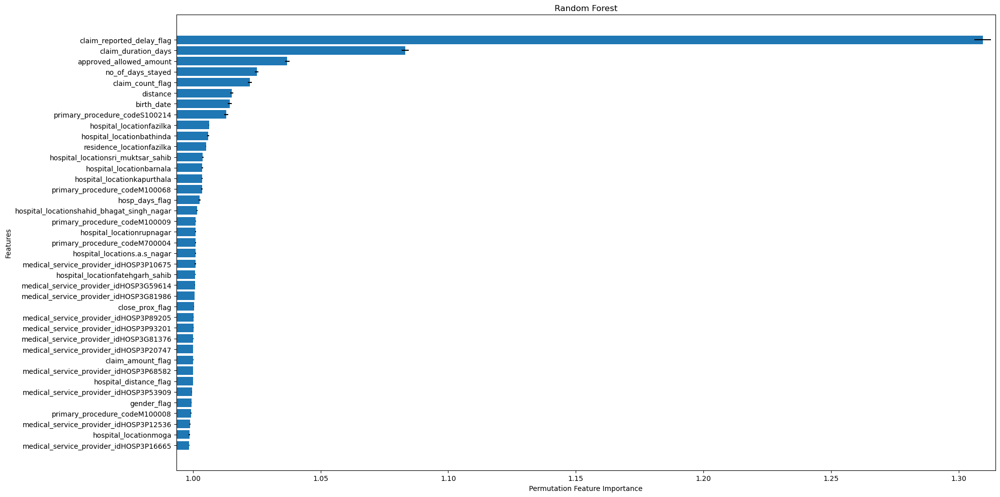

In [74]:
pfi_rdf(mwmote_w_triggers_train, mwmote_w_triggers_test, ['f1'])

#### ROSE

Random Over-Sampling Examples

Without triggers

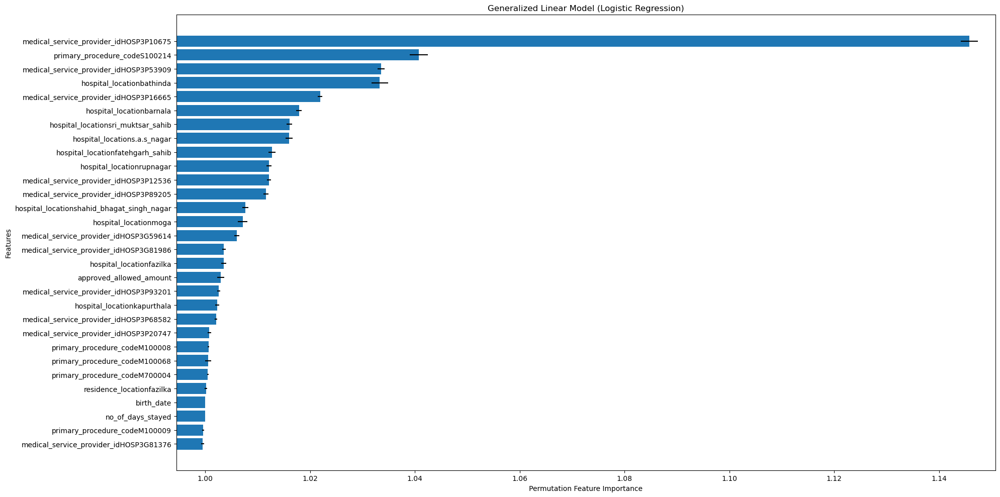

In [75]:
pfi_log(rose_wo_triggers_train, rose_wo_triggers_test, ['f1'])

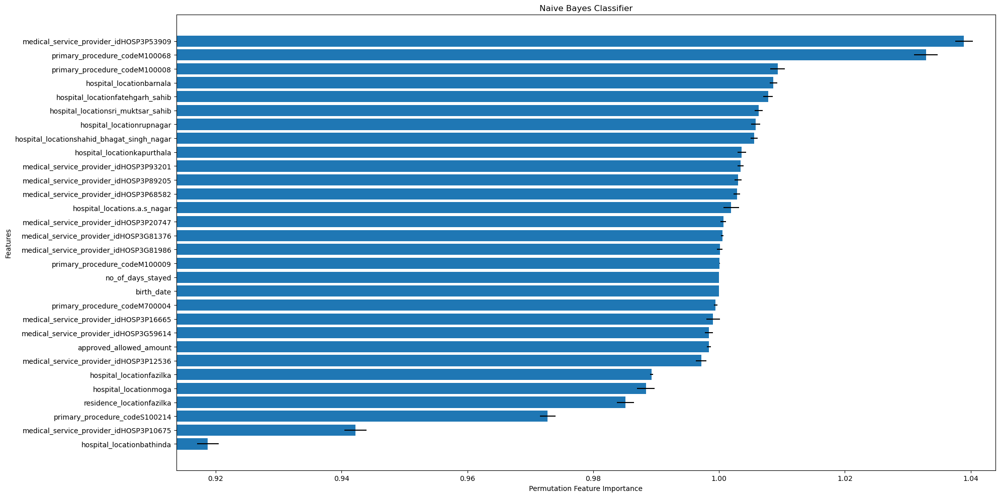

In [76]:
pfi_nb(rose_wo_triggers_train, rose_wo_triggers_test, ['f1'])

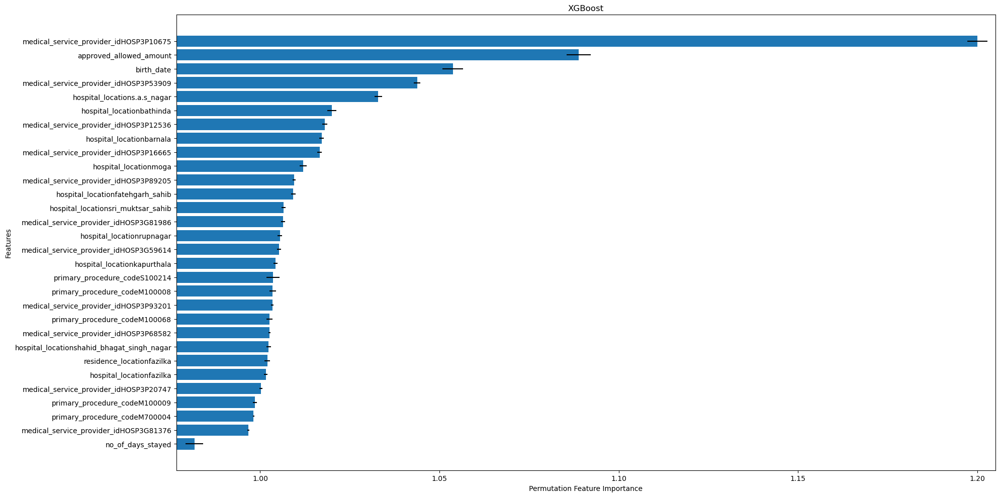

In [77]:
pfi_xgb(rose_wo_triggers_train, rose_wo_triggers_test, ['f1'])

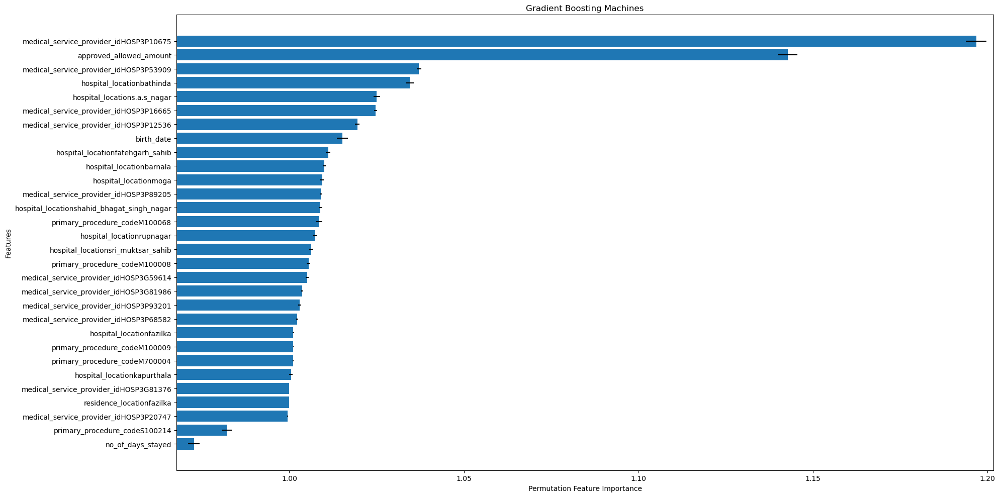

In [78]:
pfi_gbm(rose_wo_triggers_train, rose_wo_triggers_test, ['f1'])

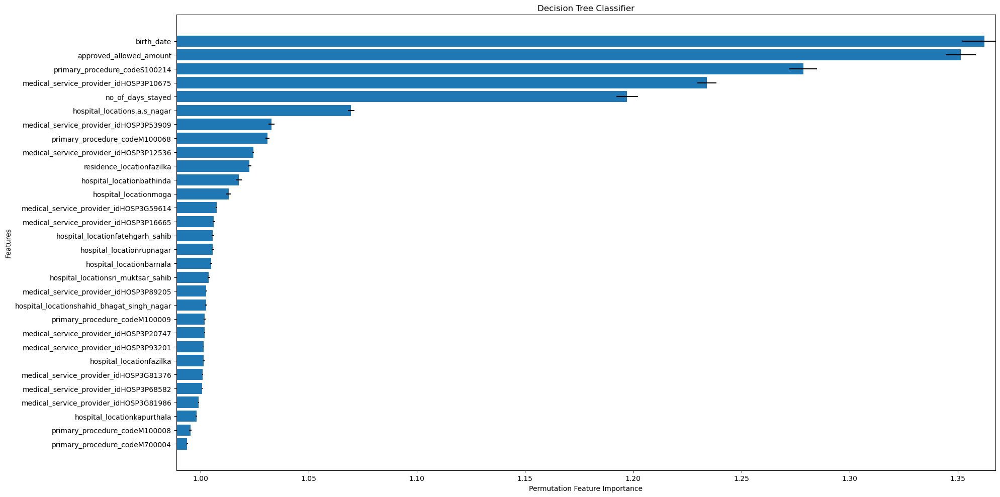

In [79]:
pfi_dtc(rose_wo_triggers_train, rose_wo_triggers_test, ['f1'])

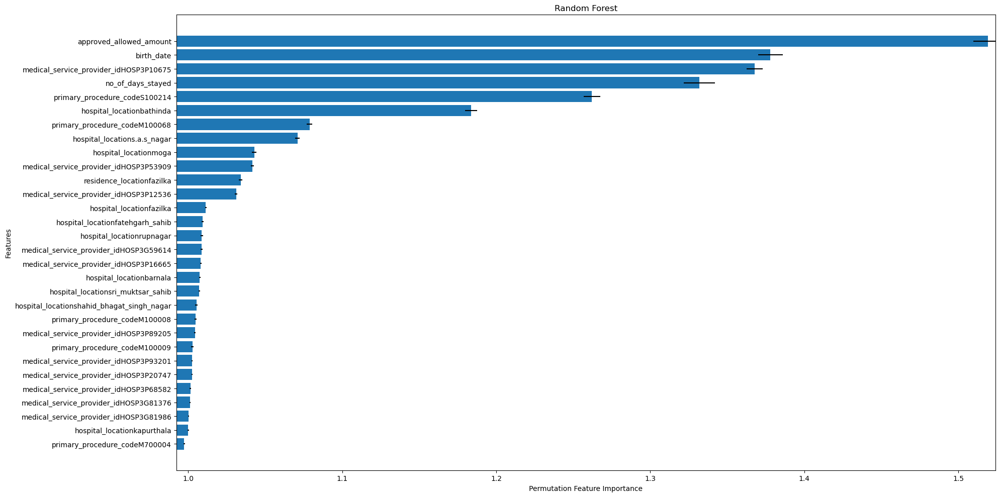

In [80]:
pfi_rdf(rose_wo_triggers_train, rose_wo_triggers_test, ['f1'])

With triggers

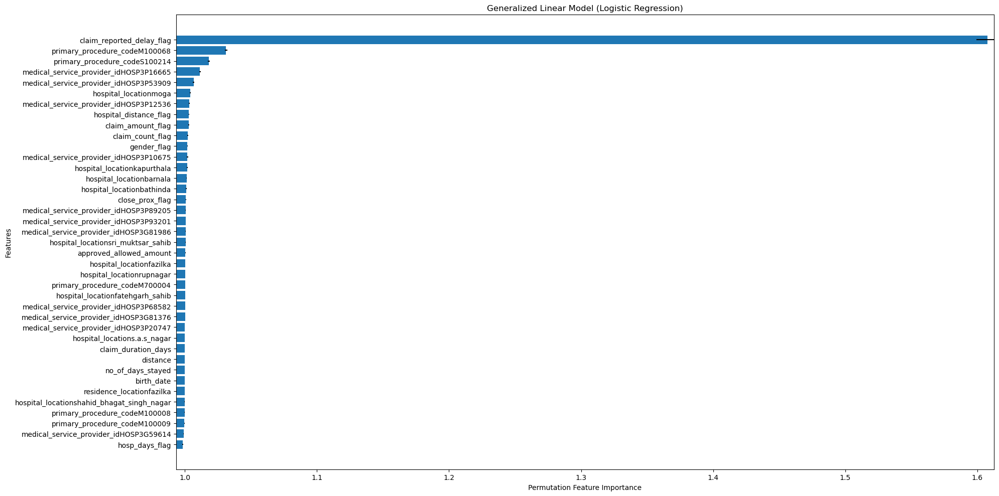

In [81]:
pfi_log(rose_w_triggers_train, rose_w_triggers_test, ['f1'])

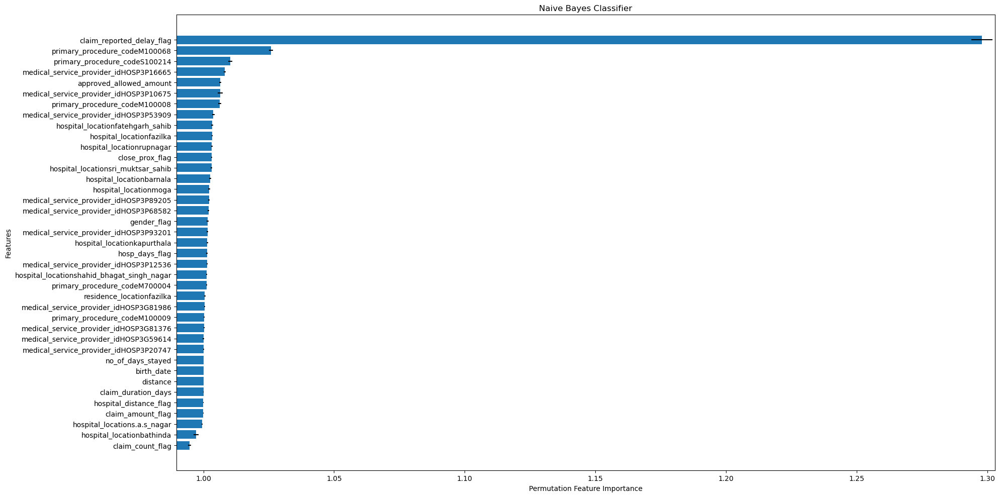

In [82]:
pfi_nb(rose_w_triggers_train, rose_w_triggers_test, ['f1'])

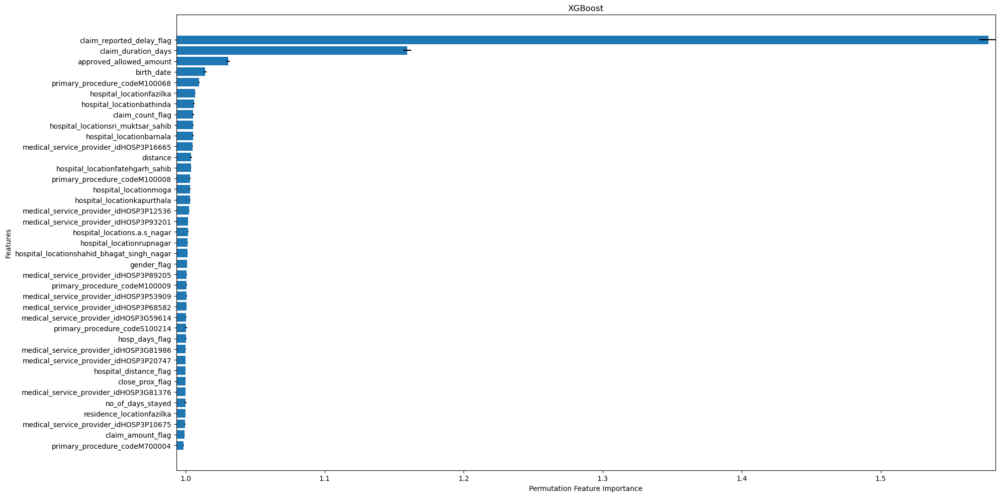

In [83]:
pfi_xgb(rose_w_triggers_train, rose_w_triggers_test, ['f1'])

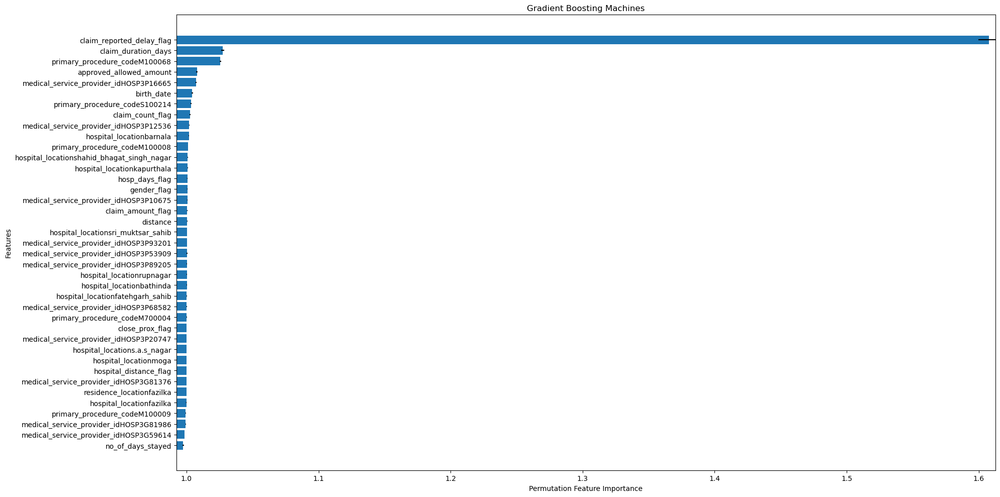

In [84]:
pfi_gbm(rose_w_triggers_train, rose_w_triggers_test, ['f1'])

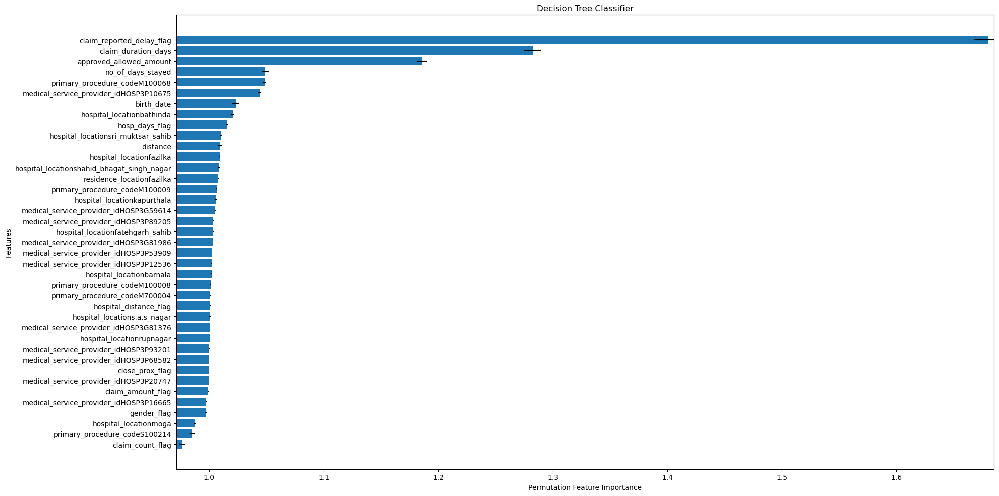

In [85]:
pfi_dtc(rose_w_triggers_train, rose_w_triggers_test, ['f1'])

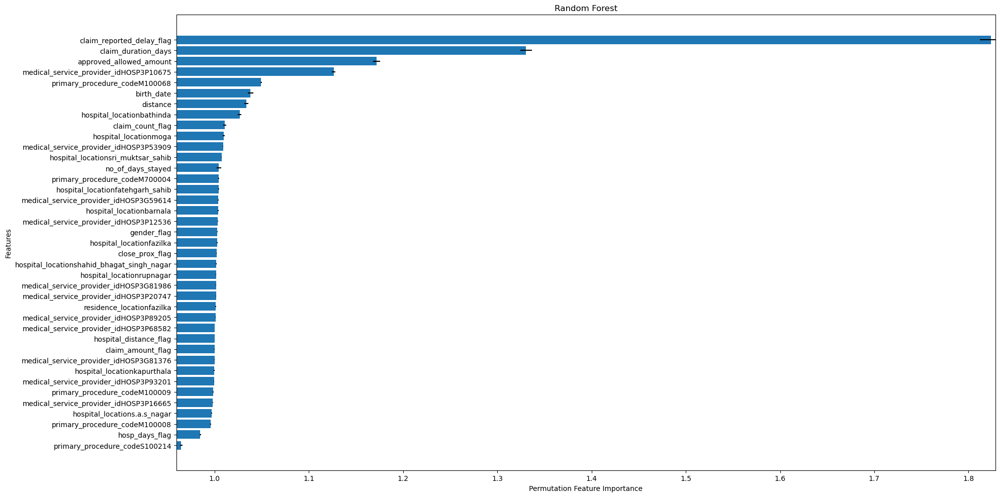

In [86]:
pfi_rdf(rose_w_triggers_train, rose_w_triggers_test, ['f1'])

## CORRELATED FEATURES

### Correlated Metrics

In [27]:
data_for_corr

,insured_id,benefit_type,treatment_start_date,treatment_end_date,claim_reported_date,approved_allowed_amount,medical_service_provider_id,no_of_days_stayed,primary_diagnosis_code,primary_procedure_code,hospital_type,category,policy_commencement_date,policy_termination_date,birth_date,gender_code,residence_location,claim_count_pa,hospital_location,fraud
0,PFZ70XHNA,MEDICAL,2019-08-31,2019-04-09,2019-04-09,15300.0,HOSP3P63880,5.0,M1,M100009,Private,NFSA,2019-08-20,2020-08-19,33.0,Male,ludhiana,1.0,ludhiana,0.0
1,PLJLADC4Z,MEDICAL,2019-08-31,2019-04-09,2019-04-09,13500.0,HOSP3P73510,5.0,M1,M100026,Private,NFSA,2019-08-20,2020-08-19,29.0,Female,tarn taran,1.0,tarn taran,0.0
2,PDAZJSGA2,MEDICAL,2019-03-09,2019-04-09,2019-04-09,16200.0,HOSP3P63880,2.0,M1,M100008,Private,NFSA,2019-08-20,2020-08-19,65.0,Male,ludhiana,5.0,ludhiana,0.0
3,PRNUSW4LB,MEDICAL,2019-03-09,2019-05-09,2019-05-09,10800.0,HOSP3G60508,3.0,M1,M100011,Public,NFSA,2019-08-20,2020-08-19,76.0,Male,amritsar,1.0,amritsar,0.0
4,PJY24G4MP,MEDICAL,2019-08-29,2019-03-09,2019-03-09,10800.0,HOSP3G81997,6.0,M1,M100043,Public,NFSA,2019-08-20,2020-08-19,18.0,Female,ludhiana,1.0,ludhiana,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
202969,PUCTJ7RW5,SURGICAL,2020-02-04,2020-02-04,2020-04-04,2200.0,HOSP3P69756,1.0,S1,S100214,Private,NFSA,2019-08-20,2020-08-19,51.0,Male,barnala,80.0,bathinda,0.0
202970,P7G8I13K8,SURGICAL,2020-03-31,2020-01-04,2020-04-04,1800.0,HOSP3G81984,2.0,U1,U100,Public,NFSA,2019-08-20,2020-08-19,50.0,Male,amritsar,1.0,amritsar,0.0
202971,PLUQL6HLW,SURGICAL,2020-03-31,2020-01-04,2020-04-04,1800.0,HOSP3G81984,2.0,U1,U100,Public,NFSA,2019-08-20,2020-08-19,56.0,Male,amritsar,1.0,amritsar,0.0
202972,PUTGOJ96V,SURGICAL,2020-03-31,2020-02-04,2020-04-04,7500.0,HOSP3G81707,3.0,U1,U100,Public,NFSA,2019-08-20,2020-08-19,20.0,Female,ludhiana,1.0,ludhiana,0.0


In [28]:
data_for_corr.columns

Index(['insured_id', 'benefit_type', 'treatment_start_date',
       'treatment_end_date', 'claim_reported_date', 'approved_allowed_amount',
       'medical_service_provider_id', 'no_of_days_stayed',
       'primary_diagnosis_code', 'primary_procedure_code', 'hospital_type',
       'category', 'policy_commencement_date', 'policy_termination_date',
       'birth_date', 'gender_code', 'residence_location', 'claim_count_pa',
       'hospital_location', 'fraud'],
      dtype='object')

In [29]:
data_for_corr.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 183115 entries, 0 to 202973
Data columns (total 20 columns):
 #   Column                       Non-Null Count   Dtype         
---  ------                       --------------   -----         
 0   insured_id                   183115 non-null  object        
 1   benefit_type                 183115 non-null  object        
 2   treatment_start_date         183115 non-null  datetime64[ns]
 3   treatment_end_date           183115 non-null  datetime64[ns]
 4   claim_reported_date          183115 non-null  datetime64[ns]
 5   approved_allowed_amount      183115 non-null  float64       
 6   medical_service_provider_id  183115 non-null  object        
 7   no_of_days_stayed            183115 non-null  float64       
 8   primary_diagnosis_code       183115 non-null  object        
 9   primary_procedure_code       183115 non-null  object        
 10  hospital_type                183115 non-null  object        
 11  category                  

#### Correlation matrix for Continuous features

In [30]:
data_for_corr.corr(method= 'pearson')

,approved_allowed_amount,no_of_days_stayed,birth_date,claim_count_pa,fraud
approved_allowed_amount,1.000000,0.266505,0.143711,-0.241692,0.009249
no_of_days_stayed,0.266505,1.000000,-0.006176,-0.331650,0.015161
birth_date,0.143711,-0.006176,1.000000,0.060574,0.021571
claim_count_pa,-0.241692,-0.331650,0.060574,1.000000,-0.018697
fraud,0.009249,0.015161,0.021571,-0.018697,1.000000


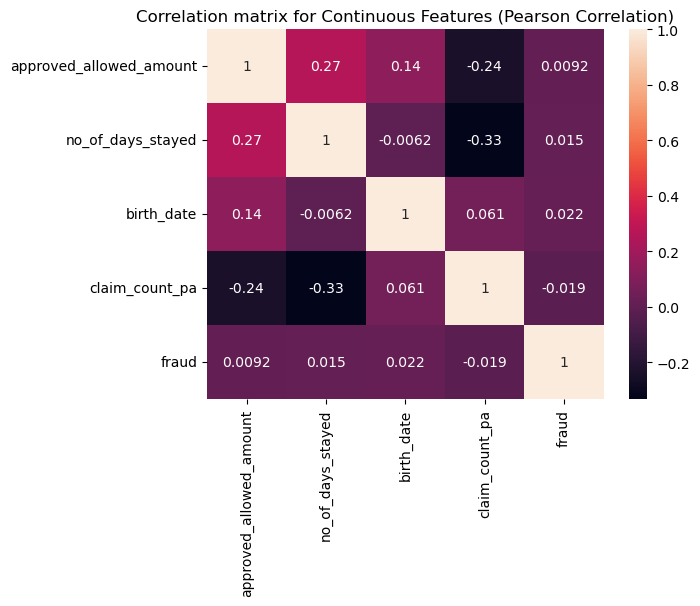

In [31]:
import seaborn as sns

sns.heatmap(data_for_corr.corr(method= 'pearson'), annot= True).set(title= "Correlation matrix for Continuous Features (Pearson Correlation)");

#### Cramer's V correlation matrix for categorical features

In [32]:
num_cols = ['approved_allowed_amount', 'no_of_days_stayed', 'birth_date', 'claim_count_pa', 'fraud' , 'treatment_start_date', 'treatment_end_date', 'claim_reported_date', 'policy_commencement_date', 'policy_termination_date']

data_cv = data_for_corr[[i for i in data_for_corr.columns if i not in num_cols]]

data_cv.head()

,insured_id,benefit_type,medical_service_provider_id,primary_diagnosis_code,primary_procedure_code,hospital_type,category,gender_code,residence_location,hospital_location
0,PFZ70XHNA,MEDICAL,HOSP3P63880,M1,M100009,Private,NFSA,Male,ludhiana,ludhiana
1,PLJLADC4Z,MEDICAL,HOSP3P73510,M1,M100026,Private,NFSA,Female,tarn taran,tarn taran
2,PDAZJSGA2,MEDICAL,HOSP3P63880,M1,M100008,Private,NFSA,Male,ludhiana,ludhiana
3,PRNUSW4LB,MEDICAL,HOSP3G60508,M1,M100011,Public,NFSA,Male,amritsar,amritsar
4,PJY24G4MP,MEDICAL,HOSP3G81997,M1,M100043,Public,NFSA,Female,ludhiana,ludhiana


In [33]:
from sklearn import preprocessing

label = preprocessing.LabelEncoder()
data_encoded_cv = pd.DataFrame()

for i in data_cv.columns:
    data_encoded_cv[i] = label.fit_transform(data_cv[i])

data_encoded_cv.head()

,insured_id,benefit_type,medical_service_provider_id,primary_diagnosis_code,primary_procedure_code,hospital_type,category,gender_code,residence_location,hospital_location
0,53212,0,474,0,8,0,3,1,11,11
1,71992,0,505,0,25,0,3,0,21,21
2,44365,0,474,0,7,0,3,1,11,11
3,92288,0,28,0,10,1,3,1,0,0
4,66451,0,151,0,42,1,3,0,11,11


In [34]:
from scipy.stats import chi2_contingency

def cramers_V(var1,var2) :
  crosstab = np.array(pd.crosstab(var1, var2, rownames=None, colnames=None)) # Cross table building
  stat = chi2_contingency(crosstab)[0] # Keeping of the test statistic of the Chi2 test
  obs = np.sum(crosstab) # Number of observations
  mini = min(crosstab.shape) - 1 # Take the minimum value between the columns and the rows of the cross table
  return (stat / (obs * mini))

In [35]:
rows= []

for var1 in data_encoded_cv:
  col = []
  for var2 in data_encoded_cv :
    try:
        cramers = cramers_V(data_encoded_cv[var1], data_encoded_cv[var2]) # Cramer's V test
        # print(f'Calculating Cramer\'s V for {var1} and {var2}: {cramers}')
        col.append(round(cramers, 2)) # Keeping of the rounded value of the Cramer's V  
    except Exception as e:
        if var1 == var2:
          col.append(1.00)
        # print(f'Error for {var1} and {var2}: {e}')

  rows.append(col)
  
cramers_results = np.array(rows)
cv = pd.DataFrame(cramers_results, columns= data_encoded_cv.columns, index= data_encoded_cv.columns)

In [36]:
cv

,insured_id,benefit_type,medical_service_provider_id,primary_diagnosis_code,primary_procedure_code,hospital_type,category,gender_code,residence_location,hospital_location
insured_id,1.00,0.89,0.95,0.87,0.84,0.96,0.94,1.00,1.00,0.98
benefit_type,0.89,1.00,0.32,1.00,1.00,0.03,0.02,0.00,0.05,0.07
medical_service_provider_id,0.95,0.32,1.00,0.22,0.03,1.00,0.03,0.11,0.61,1.00
primary_diagnosis_code,0.87,1.00,0.22,1.00,1.00,0.29,0.01,0.17,0.01,0.02
primary_procedure_code,0.84,1.00,0.03,1.00,1.00,0.51,0.02,0.25,0.03,0.05
hospital_type,0.96,0.03,1.00,0.29,0.51,1.00,0.04,0.06,0.07,0.16
category,0.94,0.02,0.03,0.01,0.02,0.04,1.00,0.02,0.01,0.01
gender_code,1.00,0.00,0.11,0.17,0.25,0.06,0.02,1.00,0.01,0.02
residence_location,1.00,0.05,0.61,0.01,0.03,0.07,0.01,0.01,1.00,0.57
hospital_location,0.98,0.07,1.00,0.02,0.05,0.16,0.01,0.02,0.57,1.00


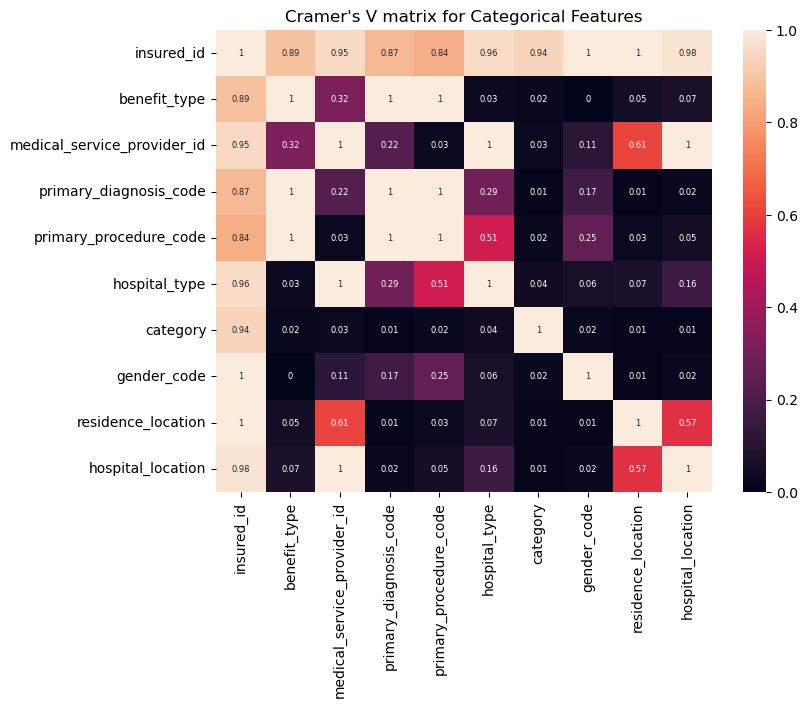

In [37]:
plt.figure(figsize= (8, 6))
sns.heatmap(cv, annot= True, annot_kws= {"size": 6}).set(title= "Cramer's V matrix for Categorical Features");
plt.show()

#### Correlation Matrix between Continuous features and Categorical features

In [38]:
import scipy.stats as stats
from sklearn import preprocessing

In [42]:
le = preprocessing.LabelEncoder()

data_pbs = data_for_corr.copy(deep= True)

num_cols = ['approved_allowed_amount', 'no_of_days_stayed', 'birth_date', 'claim_count_pa', 'fraud']
cat_cols = ['insured_id', 'benefit_type', 'treatment_start_date', 'treatment_end_date', 'claim_reported_date', 'medical_service_provider_id', 'primary_diagnosis_code', 'primary_procedure_code', 'hospital_type', 'category', 'gender_code', 'residence_location', 'hospital_location']
# policy_commencement_date, policy_termination_date

for i in cat_cols:
    data_pbs[i] = label.fit_transform(data_pbs[i])

In [43]:
rows= []

for var1 in num_cols:
  col = []
  for var2 in cat_cols :
    pt_bsrl = stats.pointbiserialr(data_pbs[var1], data_pbs[var2])[0] # Point Biserial correlation
    col.append(round(pt_bsrl,2)) # Keeping of the rounded value of the Point Biserial correlation  
  rows.append(col)
  
pbs_results = np.array(rows)
pbs = pd.DataFrame(pbs_results, columns= cat_cols, index= num_cols)
pbs = pbs.replace(-0.00, 0)

In [44]:
pbs.T

,approved_allowed_amount,no_of_days_stayed,birth_date,claim_count_pa,fraud
insured_id,0.00,0.00,0.01,0.01,0.00
benefit_type,0.08,-0.22,-0.06,0.36,-0.02
treatment_start_date,-0.02,-0.08,0.04,0.13,-0.01
treatment_end_date,0.00,-0.01,0.04,0.11,-0.01
claim_reported_date,-0.01,0.00,0.03,0.10,0.04
medical_service_provider_id,0.15,-0.17,0.24,0.39,0.00
primary_diagnosis_code,0.11,-0.10,-0.18,0.11,-0.02
primary_procedure_code,0.15,-0.09,-0.18,0.04,-0.02
hospital_type,-0.22,0.19,-0.27,-0.41,-0.02
category,-0.03,-0.01,-0.02,0.01,0.00


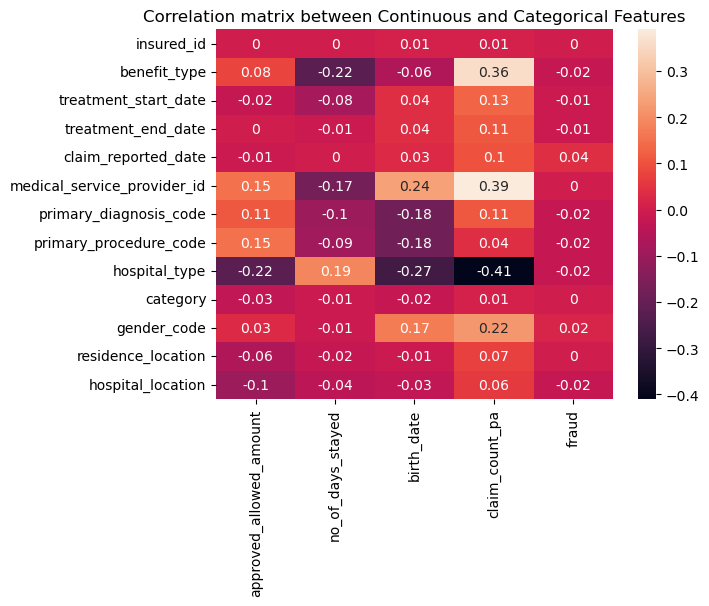

In [45]:
sns.heatmap(pbs.T, annot= True).set(title= 'Correlation matrix between Continuous and Categorical Features');

### Impact of Correlation on Feature Importance

In [227]:
# Correlation on Feature Importance; model: Random Forest Classifier
def CFI_rfc(train_data, test_data,  col):

    # Splitting data
    X_train = train_data.drop("fraud", axis= 1)
    y_train = train_data["fraud"]
    X_test = test_data.drop("fraud", axis= 1)
    y_test = test_data["fraud"]

    # Fit a Random Forest Regressor
    clf = RandomForestClassifier(random_state= 81)
    clf.fit(X_train, y_train)

    # Calculate feature importance scores without considering correlations
    feature_importance_with_corr = clf.feature_importances_

    # Fit a Random Forest Regressor on a dataset with correlated features removed
    X_uncorrelated = X_train.drop(col, axis= 1)
    clf_uncorrelated = RandomForestClassifier(random_state= 81)
    clf_uncorrelated.fit(X_uncorrelated, y_train)

    # Calculate feature importance scores with correlated features removed
    feature_importance_without_corr = clf_uncorrelated.feature_importances_

    df = pd.DataFrame(
        {'Features' : X_train.columns,
         f'Excluding {col}' : feature_importance_with_corr
        })

    temp = pd.DataFrame(
        {'Features' : X_uncorrelated.columns,
         f'Including {col}' : feature_importance_without_corr
        })

    df = df.merge(temp, on= 'Features', how= 'outer')

    df['Absolute Change'] = df[f'Excluding {col}'] - df[f'Including {col}']

    display(df)

    df= df.sort_values(by= f'Including {col}', ascending=True)

    df.drop('Absolute Change', axis= 1).plot(kind= "barh", figsize=(20, 10), title= f"Random Forest Classifier comparison with and without the {col} feature")
    plt.yticks(range(df.shape[0]), df['Features'])
    plt.show()
    
    return 

In [228]:
# Correlation on Feature Importance; model: XGBoost Classifier
def CFI_xgbc(train_data, test_data, col):

    # Splitting data
    X_train = train_data.drop("fraud", axis= 1)
    y_train = train_data["fraud"]
    X_test = test_data.drop("fraud", axis= 1)
    y_test = test_data["fraud"]

    # Fit a XGBoost classifier
    clf = XGBClassifier(importance_type= 'weight', random_state= 81)
    clf.fit(X_train, y_train)

    # Fit an XGBoost classifier on a dataset with correlated features removed
    X_uncorrelated = X_train.drop(columns=[col])
    
    clf_uncorrelated = xgb.XGBClassifier(importance_type= 'weight', random_state=81)
    clf_uncorrelated.fit(X_uncorrelated, y_train)

    plt.show()
    
    feature_importance_with_corr= clf.feature_importances_
    feature_importance_without_corr= clf_uncorrelated.feature_importances_


    df = pd.DataFrame(
        {'Features' : X_train.columns,
         f'Excluding {col}' : feature_importance_with_corr
        })

    temp = pd.DataFrame(
        {'Features' : X_uncorrelated.columns,
         f'Including {col}' : feature_importance_without_corr
        })

    df = df.merge(temp, on= 'Features', how= 'outer')

    df['Absolute Change'] = df[f'Excluding {col}'] - df[f'Including {col}']
    
    display(df)

    df= df.sort_values(by= f'Including {col}', ascending=True)

    df.drop('Absolute Change', axis= 1).plot(kind= "barh", figsize=(20, 10), title= f"XGBoost Classifier comparison with and without the {col} feature")
    plt.yticks(range(df.shape[0]), df['Features'])
    plt.show()

    return

In [243]:
# Correlation on Feature Importance; model: Logistic Regression
def CFI_lr(train_data, test_data, col):

    # Splitting data
    X_train = train_data.drop("fraud", axis= 1)
    y_train = train_data["fraud"]
    X_test = test_data.drop("fraud", axis= 1)
    y_test = test_data["fraud"]

    # Fit a Logistic Regression model
    lr = LogisticRegression(random_state= 81)
    lr.fit(X_train, y_train)

    X_uncorrelated = X_train.drop(columns=[col])
    
    lr_uncorrelated = LogisticRegression(random_state=81)
    lr_uncorrelated.fit(X_uncorrelated, y_train)
    
    feature_importance_with_corr= lr.coef_[0]
    feature_importance_without_corr= lr_uncorrelated.coef_[0]

    df = pd.DataFrame(
        {'Features' : X_train.columns,
         f'Excluding {col}' : feature_importance_with_corr
        })

    temp = pd.DataFrame(
        {'Features' : X_uncorrelated.columns,
         f'Including {col}' : feature_importance_without_corr
        })

    df = df.merge(temp, on= 'Features', how= 'outer')

    df['Absolute Change'] = df[f'Excluding {col}'] - df[f'Including {col}']

    display(df)

    df= df.sort_values(by= f'Including {col}', ascending=True)
    
    df.drop('Absolute Change', axis= 1).plot(kind= "barh", figsize=(20, 10), title= f"Logistic Regression comparison with and without the {col} feature")
    plt.yticks(range(df.shape[0]), df['Features'])
    plt.show()

    return

,Features,Excluding no_of_days_stayed,Including no_of_days_stayed,Absolute Change
0,birth_date,0.156486,0.170342,-0.013856
1,no_of_days_stayed,0.070799,NaN,NaN
2,medical_service_provider_idHOSP3P10675,0.005041,0.005533,-0.000491
3,medical_service_provider_idHOSP3P53909,0.018733,0.021436,-0.002703
4,medical_service_provider_idHOSP3P16665,0.001733,0.001544,0.000190
5,primary_procedure_codeM100068,0.042893,0.045713,-0.002820
6,medical_service_provider_idHOSP3P89205,0.001959,0.001839,0.000120
7,medical_service_provider_idHOSP3G59614,0.036458,0.037511,-0.001053
8,hospital_locations.a.s_nagar,0.010257,0.011489,-0.001232
9,medical_service_provider_idHOSP3G81986,0.005600,0.006530,-0.000930


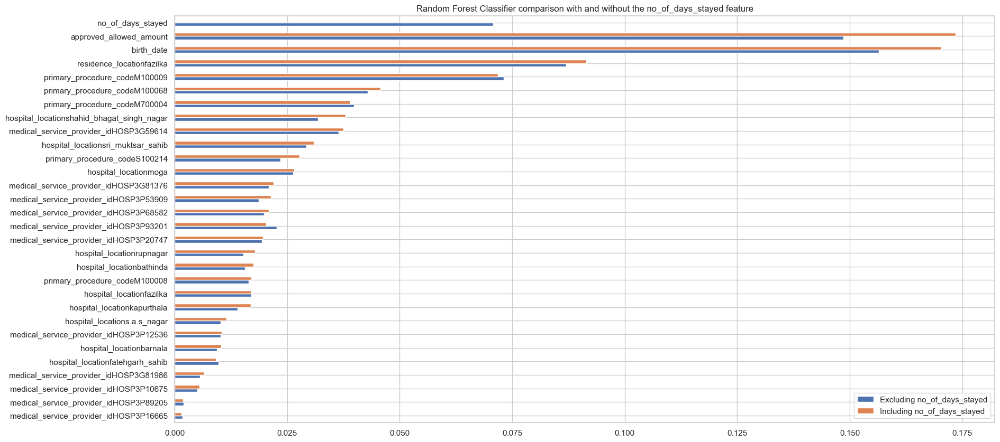

In [245]:
t = CFI_rfc(adasyn_wo_triggers_train, adasyn_wo_triggers_test,  'no_of_days_stayed')

,Features,Excluding no_of_days_stayed,Including no_of_days_stayed,Absolute Change
0,birth_date,0.274689,0.349984,-0.075294
1,no_of_days_stayed,0.188685,NaN,NaN
2,medical_service_provider_idHOSP3P10675,0.014388,0.014691,-0.000303
3,medical_service_provider_idHOSP3P53909,0.010791,0.010447,0.000344
4,medical_service_provider_idHOSP3P16665,0.002616,0.003591,-0.000975
5,primary_procedure_codeM100068,0.022891,0.022853,0.000037
6,medical_service_provider_idHOSP3P89205,0.003924,0.003591,0.000333
7,medical_service_provider_idHOSP3G59614,0.013734,0.015018,-0.001283
8,hospital_locations.a.s_nagar,0.014061,0.017303,-0.003242
9,medical_service_provider_idHOSP3G81986,0.012099,0.015344,-0.003245


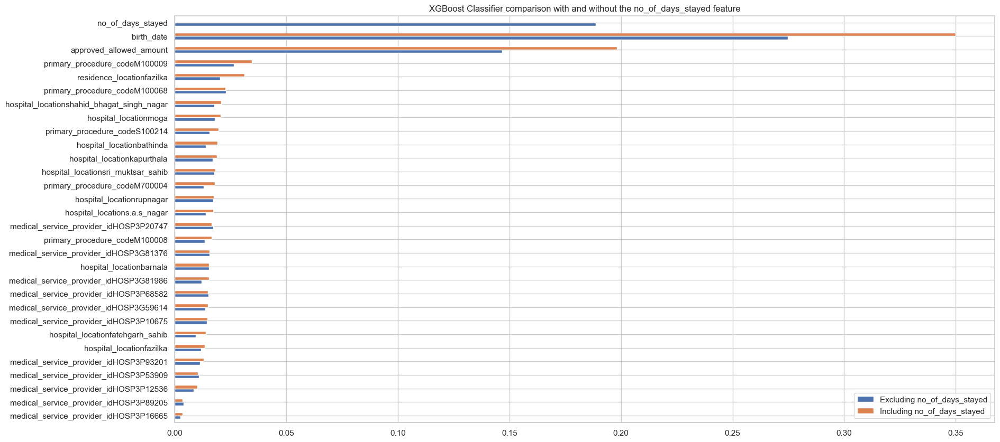

In [246]:
t = CFI_xgbc(adasyn_wo_triggers_train, adasyn_wo_triggers_test,  'no_of_days_stayed')

,Features,Excluding no_of_days_stayed,Including no_of_days_stayed,Absolute Change
0,birth_date,0.036957,0.037068,-1.109911e-04
1,no_of_days_stayed,-0.007012,NaN,NaN
2,medical_service_provider_idHOSP3P10675,-0.458356,-0.458331,-2.482200e-05
3,medical_service_provider_idHOSP3P53909,1.062352,1.062409,-5.672898e-05
4,medical_service_provider_idHOSP3P16665,-2.736799,-2.736861,6.189529e-05
5,primary_procedure_codeM100068,3.208450,3.208412,3.857522e-05
6,medical_service_provider_idHOSP3P89205,-4.318523,-4.318375,-1.478960e-04
7,medical_service_provider_idHOSP3G59614,2.001722,2.001724,-1.739454e-06
8,hospital_locations.a.s_nagar,1.042844,1.042844,-5.958921e-07
9,medical_service_provider_idHOSP3G81986,0.777106,0.777112,-5.405201e-06


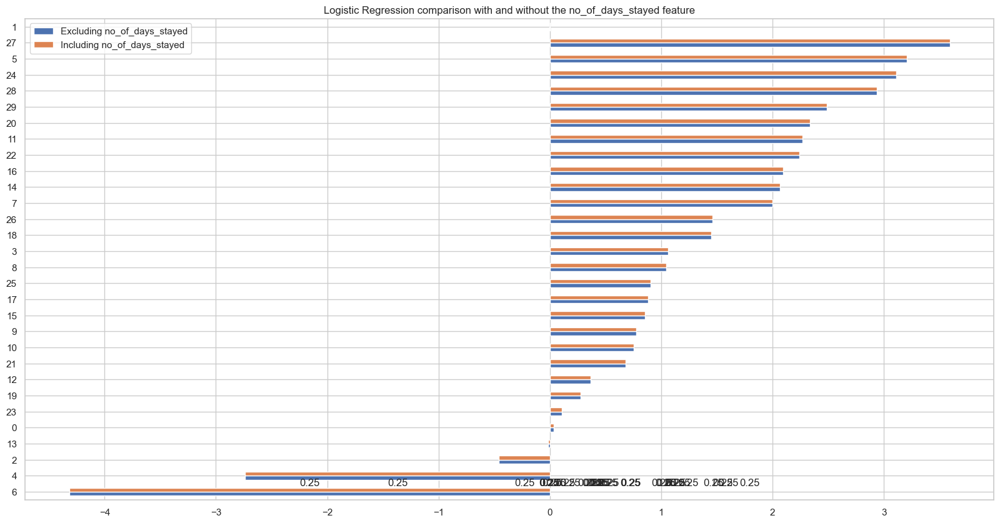

In [244]:
t = CFI_lr(adasyn_wo_triggers_train, adasyn_wo_triggers_test,  'no_of_days_stayed')